# Consumer Analysis

In [1]:
pip install kmodes

In [2]:
pip install gower

  Created wheel for gower: filename=gower-0.0.5-py3-none-any.whl size=4231 sha256=c76da337f44647bdc277b4ad98efa0e25db586213d334c1c70ad8e40fb558814
  Stored in directory: /root/.cache/pip/wheels/3e/f9/9a/67122a959a424e9cbb4557a8366c871a30e31cd75f0d003db4
Successfully built gower


## 1. Introduction and Dataset Research

The dataset was obtained from Kaggle. The dataset contains information on a company's ideal customers.<br />
It has customers' basic demographics and spending habits and has a combination of both categorical and numerical variables. There is no pre-assigned label in this dataset.
We hope to use different unsupervised learning algorithms to do an exploratory data analysis (EDA) to find different clusters of customers and understand their different purchasing behaviors.
Exploratory data analysis (EDA) is an approach of analyzing data sets to summarize their main characteristics, often using statistical graphics and other data visualization methods. (From Wikipedia)
The unsupervised learning algorithms that will be used in this project are K-means, K-prototypes, and Hierarchical Agglomerative Clustering (HAC) with complete linkage.
This analysis will be useful to help the company to understand their customers better, and it can be used to strategize their marketing efforts.

In [3]:
# add your imports here for your entire project
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
%matplotlib inline
import requests
from io import StringIO

from scipy.linalg import block_diag
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, silhouette_samples, silhouette_score
from kmodes.kprototypes import KPrototypes

from gower import gower_matrix

**Caution: Each time the code is being run, the potential clustering numbers might be different than the previous run. However, the clustering shapes and values will not change.**

**E.g.  Clusters 0, 1, 2 might become clusters 1, 0, 2**

In [4]:
# import data from Google Drive
orig_url = "https://drive.google.com/file/d/1zO555RE0KqHlDVfy61VULrGBouilSYtP/view?usp=sharing"
file_id = orig_url.split('/')[-2]
dwn_url='https://drive.google.com/uc?export=download&id=' + file_id
url = requests.get(dwn_url).text
csv_raw = StringIO(url)
df_original = pd.read_csv(csv_raw)
df_original.head()

,Year_Birth,Education,Marital_Status,Income,Kid,Teen,Dt_Customer,Recency,Wines,Fruits,Meat,Fish,Sweet,Gold,DiscountPurchases,WebPurchases,CatalogPurchases,StorePurchases,WebVisitsMonth
0,1957,Bachelor,Single,58138.0,0,0,4/9/12,58,635,88,546,172,88,88,3,8,10,4,7
1,1954,Bachelor,Single,46344.0,1,1,8/3/14,38,11,1,6,2,1,6,2,1,1,2,5
2,1965,Bachelor,Together,71613.0,0,0,21-08-2013,26,426,49,127,111,21,42,1,8,2,10,4
3,1984,Bachelor,Together,26646.0,1,0,10/2/14,26,11,4,20,10,3,5,2,2,0,4,6
4,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,118,46,27,15,5,5,3,6,5


### *Header description*

**People**<br />
Year_Birth: Customer's birth year<br />
Education: Customer's education level<br />
Marital_Status: Customer's marital status<br />
Income: Customer's yearly household income<br />
Kid: Number of children in customer's household<br />
Teen: Number of teenagers in customer's household<br />
Dt_Customer: Date of customer's enrollment with the company<br />
Recency: Number of days since customer's last purchase

**Products**<br />
Wines: Amount spent on wine in last 2 years<br />
Fruits: Amount spent on fruits in last 2 years<br />
Meat: Amount spent on meat in last 2 years<br />
Fish: Amount spent on fish in last 2 years<br />
Sweet: Amount spent on sweets in last 2 years<br />
Gold: Amount spent on gold in last 2 years

**Purchases**<br />
DiscountPurchases: Number of purchases made with a discount<br />
NumWebPurchases: Number of purchases made through the company’s web site<br />
NumCatalogPurchases: Number of purchases made using a catalogue<br />
NumStorePurchases: Number of purchases made directly in stores<br />
NumWebVisitsMonth: Number of visits to company’s web site in the last month

In [5]:
#Let't briefly check the NaN cells of this dataset.
df_original.isnull().sum()

Year_Birth            0
Education             0
Marital_Status        0
Income               24
Kid                   0
Teen                  0
Dt_Customer           0
Recency               0
Wines                 0
Fruits                0
Meat                  0
Fish                  0
Sweet                 0
Gold                  0
DiscountPurchases     0
WebPurchases          0
CatalogPurchases      0
StorePurchases        0
WebVisitsMonth        0
dtype: int64

## 2. Data Cleaning and Data Manipulation

Since there are some missing values in Income, we will substitute the missing values by the average income.

In [6]:
df_original['Income'].replace(np.nan, df_original['Income'].mean(), inplace=True)

Attributes "Dt_Customer" and "Recency" are not strongly related to customers' purchase behaviors, so I will drop these two attributes.

In [7]:
df = df_original.drop(["Dt_Customer","Recency"], axis=1)

The attribute 'year of birth' represents the customer's age. As age is more intuitive than the birth year, I converted the year of birth to the actual customer's age by subtracting their year birth by 2021. I will use age to create the model.

In [8]:
df['Age'] = 2021 - df['Year_Birth']

I also combined kid and teen together as one "Children" variable. As I plan to analyze the combined purchasing methods, I created a new "Purchases" variable.

In [9]:
df['Children'] = df['Kid'] + df['Teen']
df['Purchases'] = df['DiscountPurchases'] + df['WebPurchases'] + df['StorePurchases'] + df['CatalogPurchases']

## 3. Basic Descriptive Analytics

After cleaning, the dataset has two categorical attributes while the others are numerical attributes. Let's see the some basic descriptions of the data and each attribute.

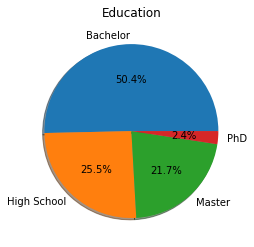

Bachelor       1126
Master          571
PhD             485
High School      54
Name: Education, dtype: int64

In [10]:
# Plot the pie chart of education level
education_value = df["Education"].value_counts().tolist()
label = df.groupby('Education').count()['Income'].index.tolist()
fig, ax = plt.subplots()
ax.pie(education_value, labels=label, autopct='%1.1f%%',shadow=True)
plt.title('Education')
plt.show()
df["Education"].value_counts()

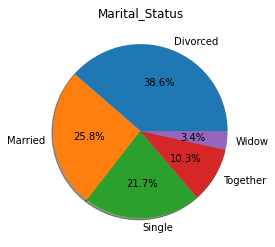

Married     864
Together    578
Single      486
Divorced    231
Widow        77
Name: Marital_Status, dtype: int64

In [11]:
# Plot the pie chart of marital status
marry_value = df["Marital_Status"].value_counts().tolist()
label = df.groupby('Marital_Status').count()['Income'].index.tolist()
fig, ax = plt.subplots()
ax.pie(marry_value, labels=label, autopct='%1.1f%%',shadow=True)
plt.title('Marital_Status')
plt.show()
df["Marital_Status"].value_counts()

In [12]:
# basic description of numerical attributes
df.describe().round(decimals=2)

,Year_Birth,Income,Kid,Teen,Wines,Fruits,Meat,Fish,Sweet,Gold,DiscountPurchases,WebPurchases,CatalogPurchases,StorePurchases,WebVisitsMonth,Age,Children,Purchases
count,2236.0,2236.00,2236.00,2236.00,2236.00,2236.00,2236.00,2236.00,2236.00,2236.00,2236.00,2236.00,2236.00,2236.00,2236.00,2236.0,2236.00,2236.00
mean,1968.9,51958.81,0.44,0.51,304.13,26.28,166.98,37.54,27.08,43.98,2.33,4.09,2.66,5.80,5.32,52.1,0.95,14.87
std,11.7,21411.38,0.54,0.54,336.59,39.72,225.69,54.65,41.30,52.06,1.93,2.78,2.92,3.25,2.43,11.7,0.75,7.68
min,1940.0,1730.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,25.0,0.00,0.00
25%,1959.0,35502.50,0.00,0.00,24.00,1.00,16.00,3.00,1.00,9.00,1.00,2.00,0.00,3.00,3.00,44.0,0.00,8.00
50%,1970.0,51684.00,0.00,0.00,174.00,8.00,67.00,12.00,8.00,24.00,2.00,4.00,2.00,5.00,6.00,51.0,1.00,15.00
75%,1977.0,68275.75,1.00,1.00,504.25,33.00,232.00,50.00,33.00,56.00,3.00,6.00,4.00,8.00,7.00,62.0,1.00,21.00
max,1996.0,162397.00,2.00,2.00,1493.00,199.00,1725.00,259.00,263.00,362.00,15.00,27.00,28.00,13.00,20.00,81.0,3.00,44.00


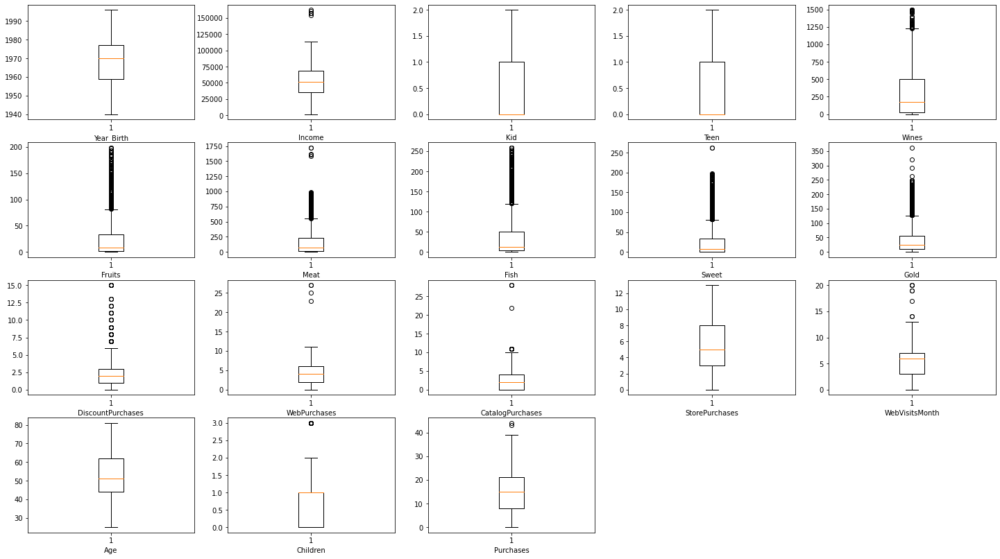

In [13]:
# plot the boxplot of the numerical attributes
num_col = df.select_dtypes(include=np.number).columns.tolist()
bins=10
j=1
fig = plt.figure(figsize = (25, 14))
for i in num_col:
    plt.subplot(4,5,j)
    plt.boxplot(df[i])
    j=j+1
    plt.xlabel(i)
    # plt.legend(i)
plt.show()

Looking at the basic summary statistics for the numerical attributes, we can see that the scale of some attributes like income is much larger than the scale of other attributes such as kid, teen, etc. To avoid the larger scale attributes from dominating our results from t-SNE plot, we will standardize the attributes before examining the clustering structure of the dataset.

***3.1.iii***<br/>
Here, we will investigate the correlations between the attributes to see if there are any strong pairwise relationship between any of the attributes

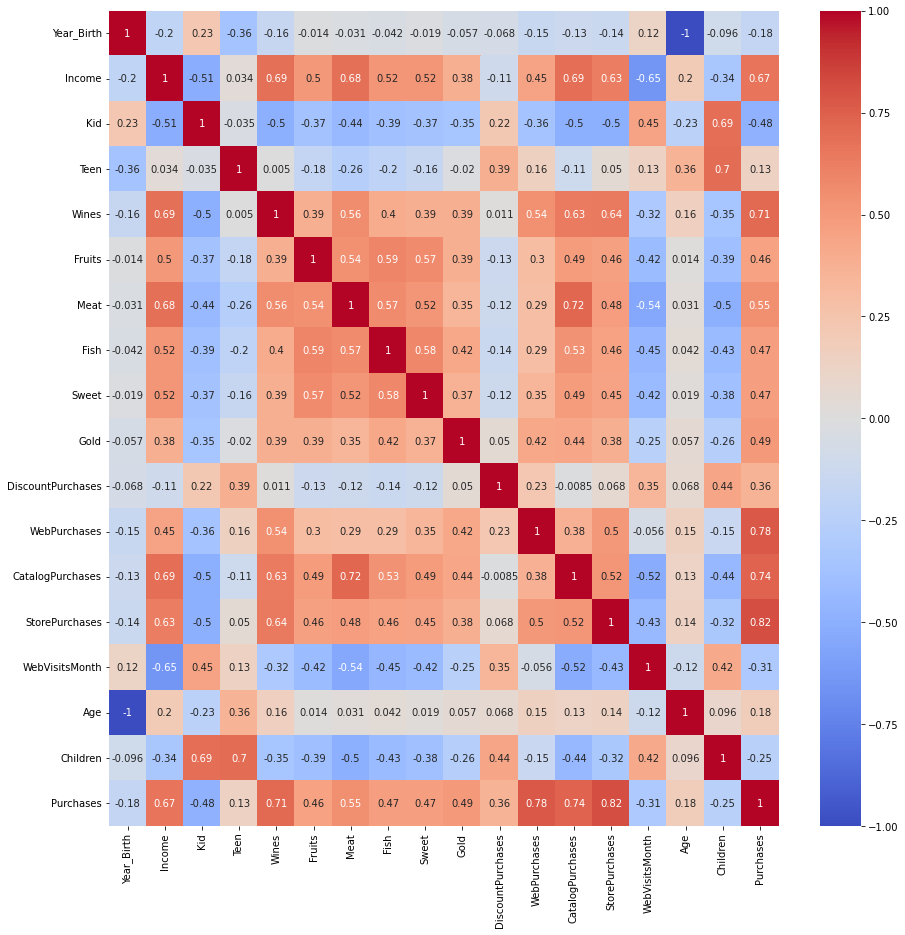

In [14]:
# Show the correlations between each attributes
corr = df.corr()
plt.figure(figsize=(15,15))
sns.heatmap(corr, annot=True, cmap='coolwarm');

From the above correlation matrix, we can see that there is some potential interesting relationship. Income is highly positively-correlated with different products purchase and negatively-correlated with discount purchases and website visits. This is something we can expect based on our intuition. Also, something that might be counter-intuitive is the negative correlations between the number of children a person has and the products he/she purchases.

## 4. Dataset Scaling Decisions

Due to the limitations of the K-means method, the following subset of attributes were chosen. Since these numerical attributes are of different scales, to avoid certain large values from dominating the model training, I scaled the data by standard scaling.

In [15]:
df_subset = df[['Income', 'Children', 'Wines', 'Fruits', 'Meat', 'Fish', 'Sweet', 'Gold', 'DiscountPurchases', 'WebPurchases','StorePurchases', 'CatalogPurchases',"WebVisitsMonth"]]
scaled_array = StandardScaler().fit_transform(df_subset) # use standardScaler to fit and transform the attributes into a matrix
df_scaled = pd.DataFrame(scaled_array, columns=df_subset.columns) # transform the matrix back to pandas dataframe withe the same headers
df_scaled.head()

,Income,Children,Wines,Fruits,Meat,Fish,Sweet,Gold,DiscountPurchases,WebPurchases,StorePurchases,CatalogPurchases,WebVisitsMonth
0,0.288658,-1.264308,0.983228,1.554170,1.679746,2.461068,1.475396,0.845669,0.348738,1.407639,-0.552429,2.509801,0.692865
1,-0.262293,1.395139,-0.871064,-0.636431,-0.713455,-0.650414,-0.631638,-0.729742,-0.168700,-1.110921,-1.167738,-0.568970,-0.131421
2,0.918137,-1.264308,0.362159,0.572177,-0.177201,1.344595,-0.147262,-0.038098,-0.686137,1.407639,1.293496,-0.226884,-0.543564
3,-1.182477,0.065416,-0.871064,-0.560893,-0.651409,-0.503991,-0.583200,-0.748954,-0.168700,-0.751127,-0.552429,-0.911056,0.280722
4,0.295899,0.065416,-0.389661,0.421101,-0.217088,0.154911,-0.001950,-0.556831,1.383614,0.328256,0.062879,0.115201,-0.131421


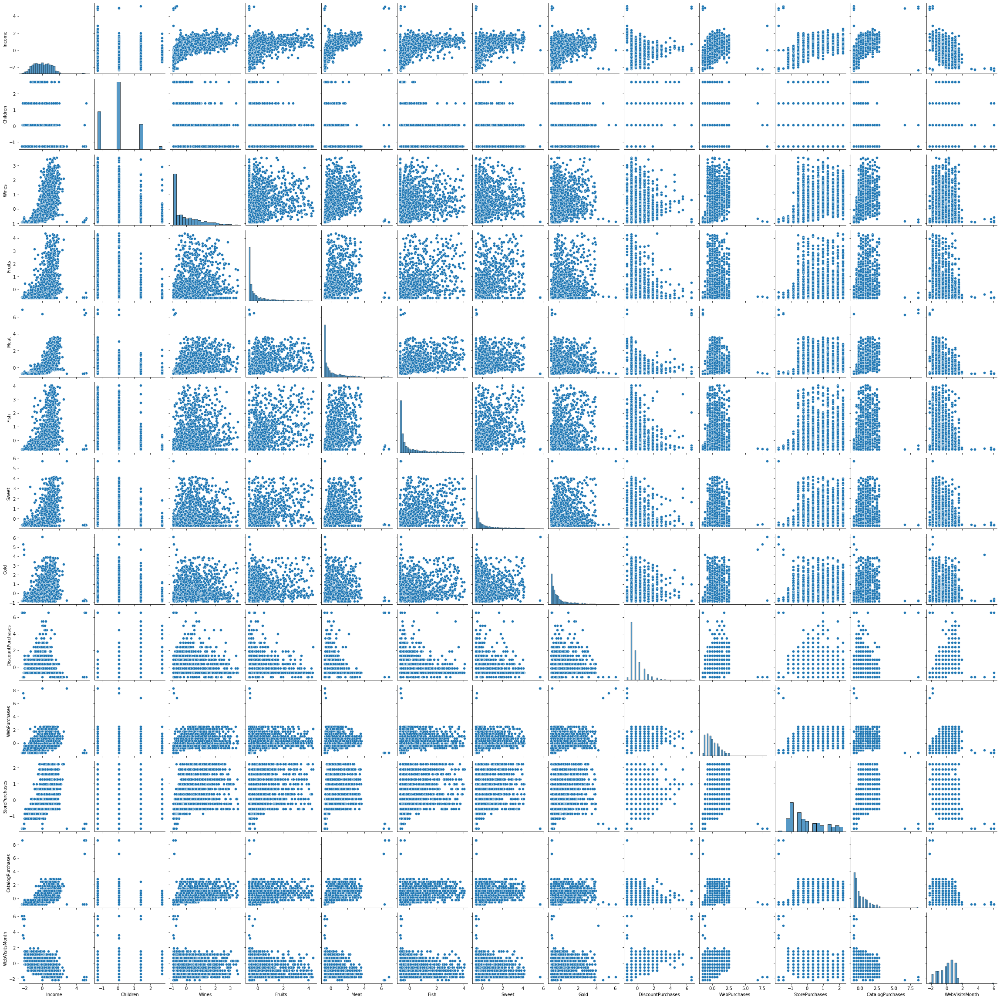

In [16]:
sns.pairplot(df_scaled)
plt.show()

Based on the scaled dataset, we can see some outliers in the plot.

## 5. Clusterability and Clustering Structure Questions

Now we have the scaled data, here comes the question. How many possible clusters are there? I will use the t-SNE plot and an elbow plot to predict the possible clustering number.

(t-SNE) t-Distributed Stochastic Neighbor Embedding is a non-linear dimensionality reduction algorithm used for exploring high-dimensional data.

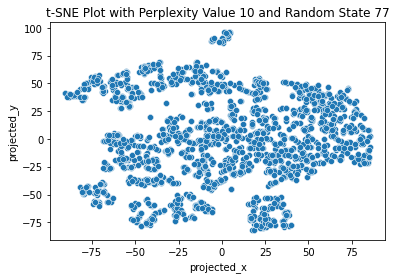

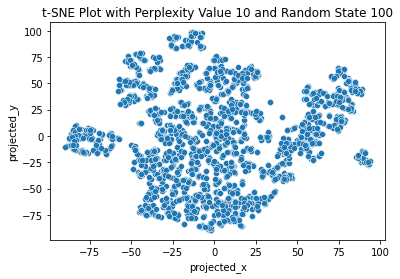

--------------------------------------------


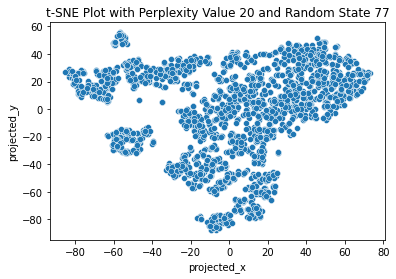

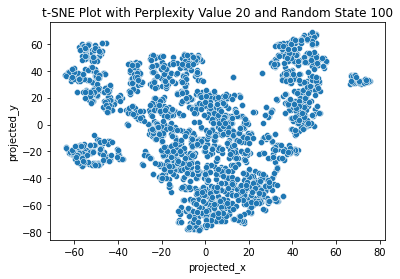

--------------------------------------------


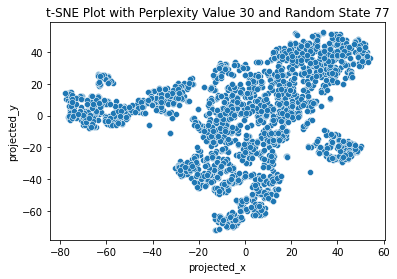

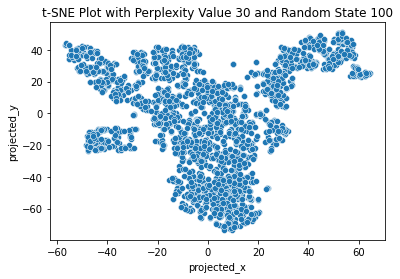

--------------------------------------------


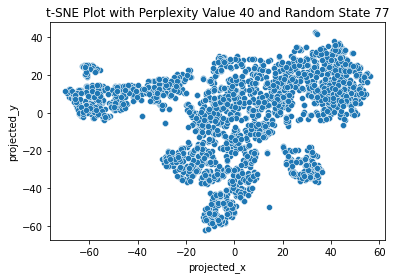

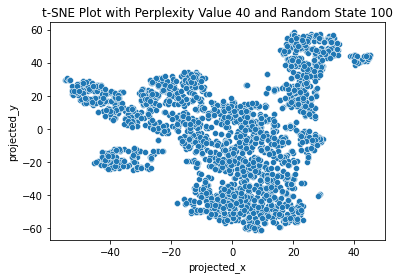

--------------------------------------------


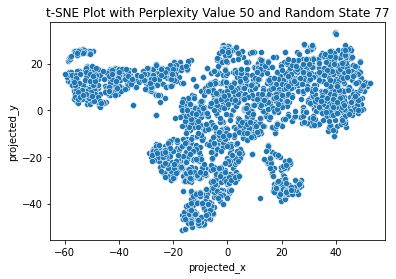

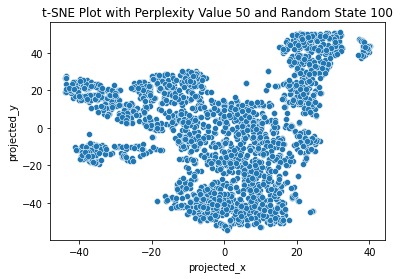

--------------------------------------------


In [17]:
for perp in [10, 20, 30, 40, 50]:
    for rs in [77, 100]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(df_scaled)
        df_tsne = pd.DataFrame(data_tsne, columns=['projected_x','projected_y'])
        df_combo = pd.concat([df_scaled, df_tsne], axis=1)
        sns.scatterplot(x ='projected_x', y='projected_y', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.show()
    print('--------------------------------------------')

**Perplexity values**: When we used a perplexity value of 10, it does not identify any of the clusters. Beginning from a perplexity value of 20, it is able to somewhat identify the shape of the cluster. There is not much difference from a value of 40, and the plot tends to remain its shape.

**Cluster Separation**: Regardless of the perplexity values and random state, we do not see a strong separation in our t-SNE plots.

Among the t-SNE plots with different perplexity value and random state, we will select one that is better at identifying the clusters. Our selected t-SNE plot has a perplexity value of 40 and random state 77. Let's visualize it one more time.

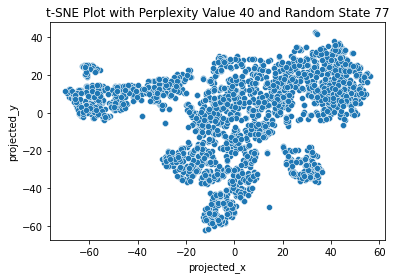

In [18]:
perp = 40
rs = 77
tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
data_tsne = tsne.fit_transform(df_scaled)
df_tsne = pd.DataFrame(data_tsne, columns=['projected_x','projected_y'])
df_combo = pd.concat([df_scaled, df_tsne], axis=1)
sns.scatterplot(x ='projected_x', y='projected_y', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
plt.show()

In the above t-SNE plot, we can see that there are roughly 3 to 4 clusters. The shape of the plot is not spherical and non convex and the data points are overlapping with each other. They also seem to be unbalanced in size. The middle big chunk of cluster contains a large number of data points. This might cause some potential problems for the K-means method (more suitable for data with spherical shape and similar data points amount among different clusters).

## 6. Algorithm Selection Motivation
Since we are going to conduct an exploratory data analysis, there are no certain pre-assigned labels in the dataset. We will use some unsupervised learning methods to generate the predictions.  

***K-means***<br/>
First, we will train a K-means model to predict and cluster the dataset. The K-means clustering algorithm is used to find groups that have not been explicitly labeled in the data. However, K-means only works for numerical values. In the piloting analysis, we tried to convert the categorical attributes into dummy variables by one hot encoding. This manipulation generated redundant dimensions, which strictly worsen the clustering. As such, for the K-means method, we only used numerical attributes to do the model training. K-means is designed to work well with dataset with spherical clusters, where each cluster has approximately the same number of objects and clusters with have the same sparsity. Since we only have two categorical attributes and most of our dataset is made up of numerical attributes, we think that K-means might be a good algorithm to cluster our dataset.<br/>
***K-prototypes***<br/>
In order to investigate the clustering structure with categorical and numerical values, we will use k-prototypes and Hiearchical Agglomerative Clustering (HAC) clustering methods. 
For K-prototypes, we will begin by using Gower's distance to measure the distance between objects. Gower's distance is used for datasets with at least one numerical and one categorical attributes. Then, we will perform k-protoypes clustering. K-prototypes is partitional clustering algorithm used when the dataset is comprised of both categorical and numerical attributes. Since our data contains both types of attributes, it will be a good idea to test this out as it will take into account our categorical attributes as well. Perhaps, it might be a better clustering algorithm than K-means for our dataset.
<br/>
***Agglomerative hiearchical clustering***<br/>
Lastly, we will use HAC clustering methods. Hiearchical clustering algorithms allow us to display a series of nested clustering, graphically displayed in a dendrogram. We will perform four types of common types of agglomerative hiearchical clustering algorithms: single linkage, complete linkage, average linkage, and ward linkage. They each have different benefits and drawbacks so we will try them all on our dataset. We will then decide which of the four algorithms work best with our data. 


### 7. K-means

First, to perform K-means, we will begin by using the elbow method which is a heuristic used in determining the number of clusters in a data set.

Text(0.5, 1.0, 'Elbow Method Results for Consumer Dataset')

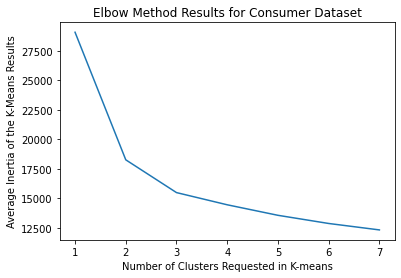

In [19]:
# try different clusters numbers and generate the elbow plot with descreasing inertias
avg_inertia_list = []
for k in range(1,8):
    sub_inertia_list = []
    for i in range(0,3):
        kmeans = KMeans(n_clusters=k).fit(df_scaled)
        sub_inertia_list.append(kmeans.inertia_)
    avg_inertia_list.append(np.average(sub_inertia_list))
    
plt.plot(range(1,8), avg_inertia_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Inertia of the K-Means Results')
plt.title('Elbow Method Results for Consumer Dataset')

**7.1. Parameter Selection**

From the above elbow plot, it appears that there are two clear elbows at cluster values k=2 and k=3, which shows that there is a clustering structure. Even though k=2 is more dramatic, considering the t-SNE plot, we chose k=3 to train the K-means model. In terms of the parameters, we used the default random state to train the model.

**7.2. Clustering algorithm**

In [20]:
# Train k-means with k=3, and concat the predicted labels back to the dataframe
kmeans = KMeans(n_clusters = 3).fit(df_scaled)
df_scaled['predicted_cluster'] = kmeans.labels_ 

**7.3. Clustering Algorithm Results Presentation**

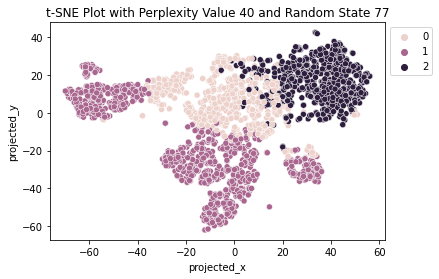

In [21]:
# Plot again the t-SNE plot with predicted labels by k=3 K-means model
df_combo = pd.concat([df_scaled, df_tsne], axis=1)
sns.scatterplot(x ='projected_x', y='projected_y',hue='predicted_cluster', data=df_combo)
plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

From the above t-SNE plot, we can see that the three clusters predicted by the K-means method separated the middle big chunk, which is not surprising. At least from the plot, we can say that clusters 0 and 1 are with better cohesion, while cluster 2 is scattered.

In order to check the distributions of each attribute, let's plot the attribute back to the t-SNE plot.

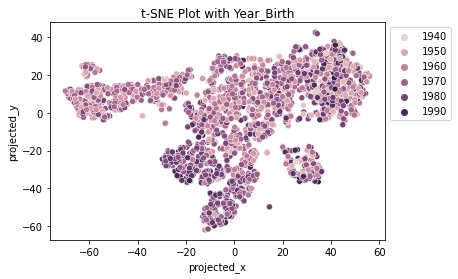

--------------------------------------------


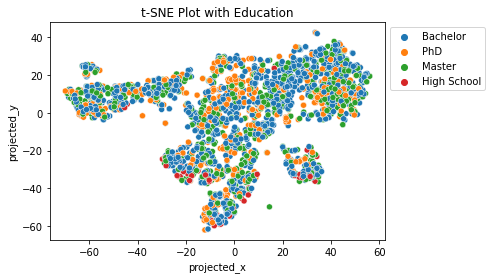

--------------------------------------------


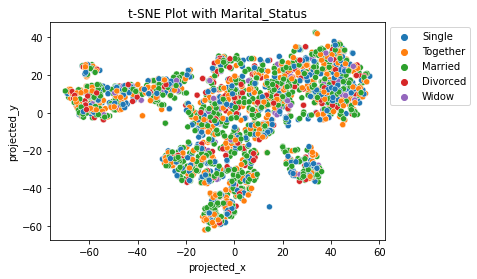

--------------------------------------------


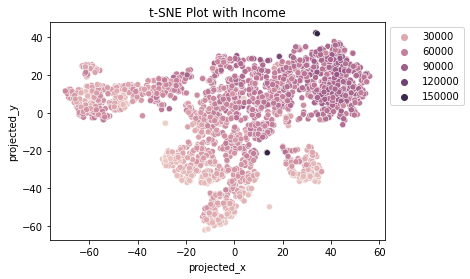

--------------------------------------------


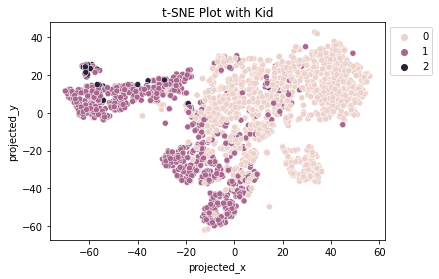

--------------------------------------------


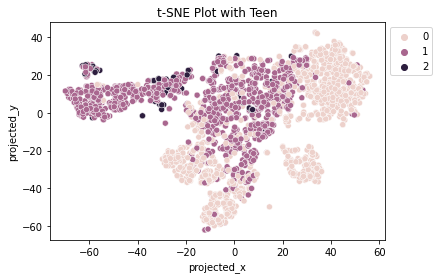

--------------------------------------------


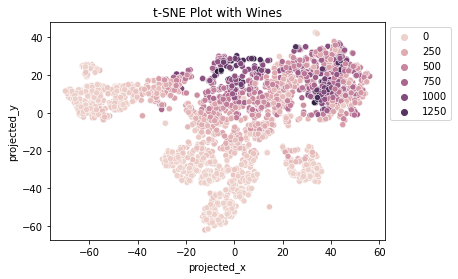

--------------------------------------------


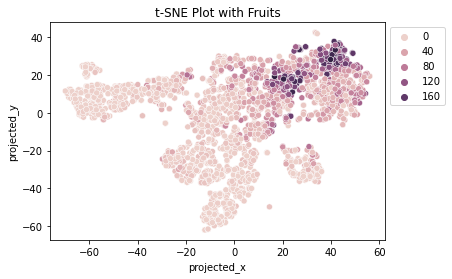

--------------------------------------------


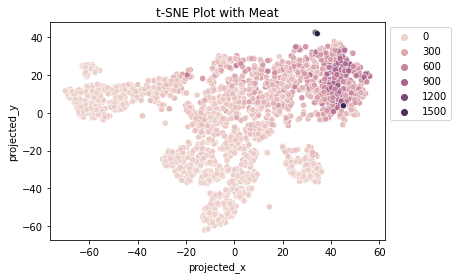

--------------------------------------------


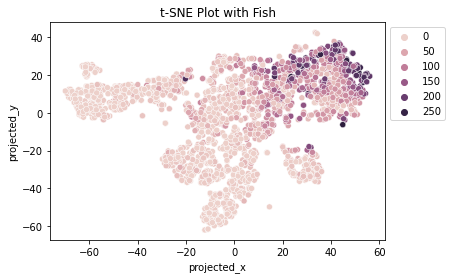

--------------------------------------------


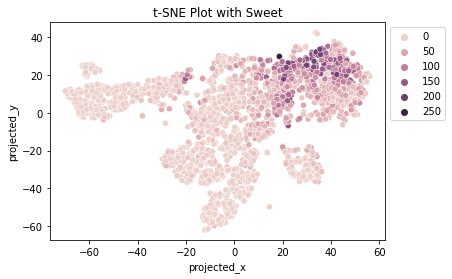

--------------------------------------------


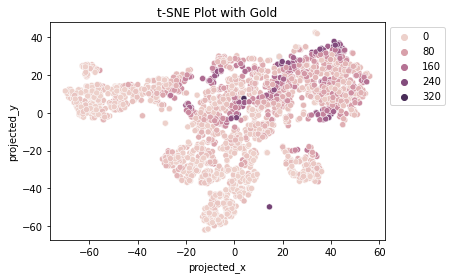

--------------------------------------------


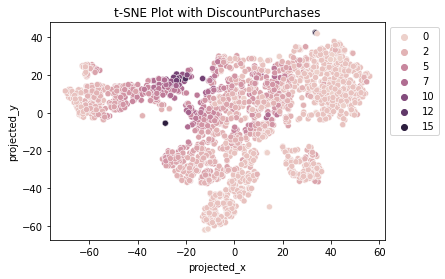

--------------------------------------------


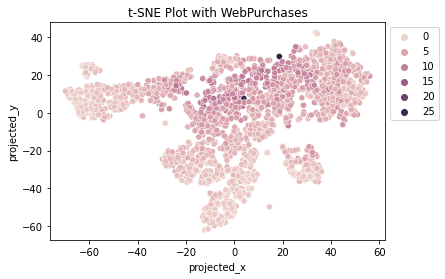

--------------------------------------------


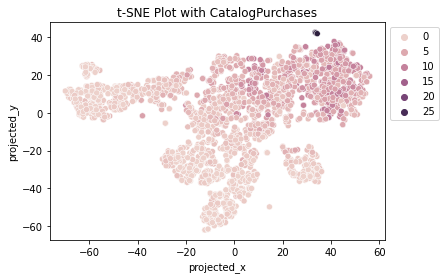

--------------------------------------------


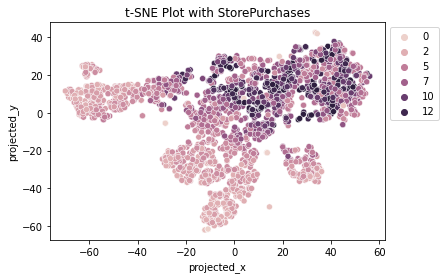

--------------------------------------------


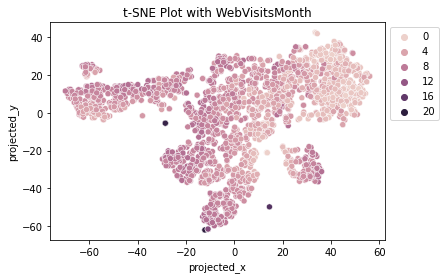

--------------------------------------------


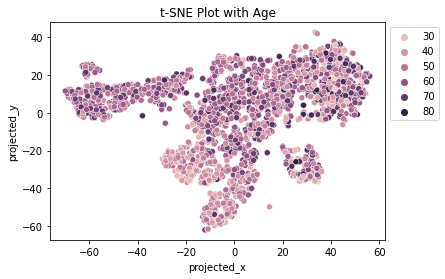

--------------------------------------------


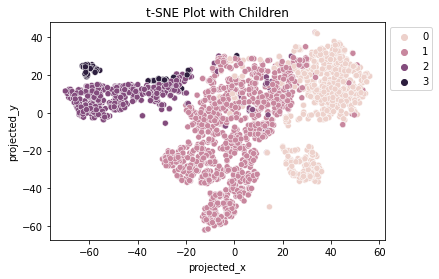

--------------------------------------------


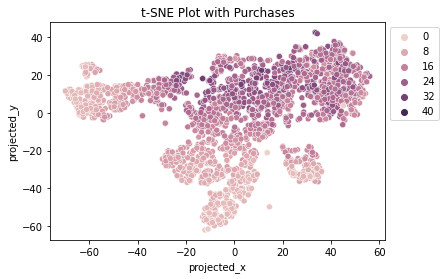

--------------------------------------------


In [22]:
# loop through the attributes and plot
df_combo_predicted = pd.concat([df, df_tsne], axis=1)
df_combo_predicted['predicted_cluster'] = kmeans.labels_
for i in df.columns:
  sns.scatterplot(x ='projected_x', y='projected_y',hue=i,data=df_combo_predicted)
  plt.title('t-SNE Plot with %s' %(i))
  plt.legend(bbox_to_anchor=(1,1))
  plt.show()
  print('--------------------------------------------')

We can see some patterns from the clustering structure. Certain attributes like marital status seem to vary throughout the different clusters without a specific pattern. However, for example in kid, it looks like customers with one kid tend to appear mostly in cluster one. But this is just a preliminary examination to give us a general idea and we will use boxplots and bar graphs to visualize each attributes within each clusters later. Now, let us assess the clustering result separation and cohesion. 

**7.4. Assessing Clustering Result Separation and Cohesion**

Let's compute and plot the Silhouette Coefficient to examine the quality of the clustering output. 

Silhouette Coefficient or silhouette score is a metric used to calculate the goodness of a clustering technique. Its value ranges from -1 to 1. 

1: Means clusters are well apart from each other and clearly distinguished.<br />
0: Means clusters are indifferent, or we can say that the distance between clusters is not significant.<br />
-1: Means clusters are assigned in the wrong way.

In [23]:
# Build the silhouette score calculating and plotting function, take dataframe and the labels as arguments
def show_silhouette_plots(X,cluster_labels):
    
    n_clusters=len(np.unique(cluster_labels))  # Number of clusters

    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    ax1.set_xlim([-0.1, 1]) # Set the silhouette coefficient range
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10]) # Set y-axis as number of clusters

    silhouette_avg = silhouette_score(X, cluster_labels) # Average silhouette coefficient values
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    plt.show()
    
    return

For n_clusters = 3 The average silhouette_score is : 0.3249073379390073


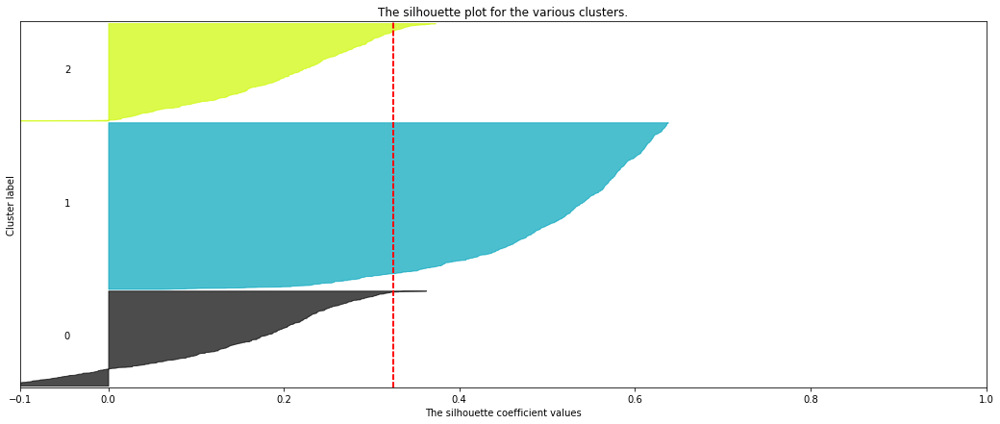

In [24]:
# Plot silhouette scores of the k=3 K-means clustering
show_silhouette_plots(df_scaled, df_scaled['predicted_cluster'])

From the above plot, we can see that these three clusters contain different numbers of values.<br/>
Cluster 1 has a much more rounded shape than the other clusters, which indicates a more uniform level of cohesion and separation among the objects assigned to that cluster. This finding contradicts the previous t-SNE intuition.
We also see that there are some objects in clusters 0 and 2 that are closer to another cluster than the one that they were assigned to.<br/>
Based on the average silhoutte score of 0.324, they have a moderate cohesion and separation. 

**7.5 Cluster-sorted similarity matrix**<br/>
Here, we will use the cluster-sorted similarity matrix to assess the separation and cohesion. First, we will sort the dataset by the predicted cluster labels and drop them from the dataset.

In [25]:
df_sort_km = df_scaled.sort_values(by=['predicted_cluster'])
df_sort_km = df_sort_km.drop(['predicted_cluster'], axis=1)
df_sort_km.head()

,Income,Children,Wines,Fruits,Meat,Fish,Sweet,Gold,DiscountPurchases,WebPurchases,StorePurchases,CatalogPurchases,WebVisitsMonth
1117,0.869227,0.065416,0.228436,0.043411,0.212802,0.850419,0.022269,-0.441557,-0.168700,0.688050,0.985842,0.799373,-0.955707
635,0.521390,0.065416,1.963863,1.075763,0.496441,0.301334,0.337113,0.480635,1.383614,1.407639,0.985842,0.457287,0.692865
1576,0.398157,0.065416,-0.145988,0.421101,-0.146178,-0.009814,-0.316794,-0.383920,-0.686137,1.047845,0.370533,-0.226884,0.692865
637,0.533583,0.065416,0.793044,0.597356,-0.110723,-0.083026,0.555082,2.209744,0.866176,-0.031538,2.216459,0.799373,-1.367850
639,0.509198,0.065416,2.255082,1.579350,-0.287997,-0.394174,-0.365231,-0.364708,0.866176,1.767433,0.062879,0.457287,0.280722


Next, we create a distance matrix between all objects and visualize it.

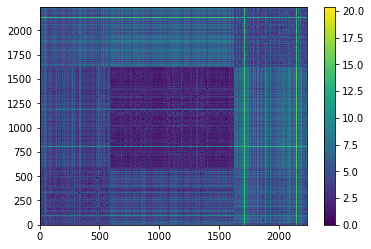

In [26]:
#Create a distance matrix
dist_mat = squareform(pdist(df_sort_km))

#Then visualize the distance matrix with a heat map.
plt.pcolormesh(dist_mat)
plt.colorbar()
N = len(df_sort_km)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

* <u>Clusters</u>: 
 - The objects in cluster 0 are shown by the sorted indices in positions [0,591] in the plot above. 
 - The objects in cluster 1 are shown by the sorted indices in positions [592,1629] in the plot above. 
 - The objects in cluster 2 are shown by the sorted indices in positions [1630,2236] in the plot above.   
 
* <u>Cluster Separation</u>: 
 - Cluster 1 is furthest away from cluster 2 (and vice versa). (The average object distances between objects in these two clusters is larger).
 - Cluster 0 is closest to cluster 1 (and vice versa).

* <u>Cluster Cohesion</u>: 
 - All three clusters have different cohesion. (The average distance of the intra-cluster distances shown on three blocks on the block diagonal are different.) Cluster 1 seems to have better cohesion than cluster 0 and 2.
 
We can use the cluster sorted similarity matrix to quantitatively evaluate the cohesion and separation of the clustering. First, we need to scale the actual cluster sorted similarity matrix.

[[1.         0.83462881 0.87906806 ... 0.87207095 0.73089836 0.7677788 ]
 [0.83462881 1.         0.83066495 ... 0.78894195 0.78731984 0.79030616]
 [0.87906806 0.83066495 1.         ... 0.8288844  0.69183037 0.73939119]
 ...
 [0.87207095 0.78894195 0.8288844  ... 1.         0.67163183 0.7392844 ]
 [0.73089836 0.78731984 0.69183037 ... 0.67163183 1.         0.79748444]
 [0.7677788  0.79030616 0.73939119 ... 0.7392844  0.79748444 1.        ]]


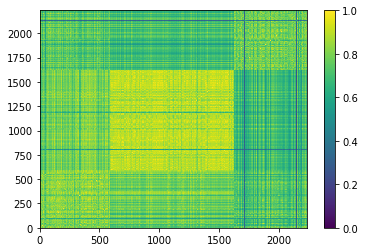

In [27]:
#Find the maximum distance in the distance matrix
min_dist=np.min(dist_mat)
#"Find" the minimum distance in the distance matrix (this will be 0) from the diagonals... ie. the distance between an object and itself is 0.
max_dist=np.max(dist_mat)

#Similarity matrix
sim_mat=1-(dist_mat-min_dist)/(max_dist-min_dist)
print(sim_mat)

#Then visualize the distance matrix with a heat map.
plt.pcolormesh(sim_mat)
plt.colorbar()
N = len(df_sort_km)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

Next, we will construct the ideal scaled similarity matrix that we would get with a clustering that had the same number of clusters with the same number of objects in it as our actual clustering had.

In [30]:
#Count the number of objects in each cluster, and sort by cluster label.
cluster_sizes=df_scaled['predicted_cluster'].value_counts().sort_index()
print('Cluster Sizes')
print(cluster_sizes)
print()

#Create a list of square matrices with all ones, each matrix is the size of a cluster.
block_list=[]
for i in cluster_sizes:
    print('Cluster Size:',i)
    block=np.ones((i,i)).tolist()
    block_list.append(block)

#Put these square matrices on the block diagonal of an otherwise 0-matrix
print()
ideal_sim_mat=block_diag(block_list[0], block_list[1], block_list[2])
ideal_sim_mat

Cluster Sizes
0     592
1    1037
2     607
Name: predicted_cluster, dtype: int64

Cluster Size: 592
Cluster Size: 1037
Cluster Size: 607



array([[1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.]])

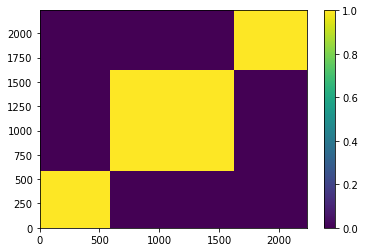

In [31]:
#Then visualize the distance matrix with a heat map.
plt.pcolormesh(ideal_sim_mat)
plt.colorbar()
N = len(df_sort_km)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

Here, we are "flattening" both of these matrices by putting all of the rows of a given matrix into a single vector.

In [32]:
flat_sim_mat=sim_mat.flatten()
print('Flattened Actual Scaled Similarity Matrix')
print(flat_sim_mat)
    
flat_ideal_sim_mat=ideal_sim_mat.flatten()
print('Flattened Ideal Scaled Similarity Matrix')
print(flat_ideal_sim_mat)

Flattened Actual Scaled Similarity Matrix
[1.         0.83462881 0.87906806 ... 0.7392844  0.79748444 1.        ]
Flattened Ideal Scaled Similarity Matrix
[1. 1. 1. ... 1. 1. 1.]


Finally, let's take the correlation of these two flattened similarity matrices.

In [33]:
np.corrcoef(flat_sim_mat,flat_ideal_sim_mat)

array([[1.        , 0.57906613],
       [0.57906613, 1.        ]])

The correlation value ranges from -1 and 1 and the higher it is to 1, the better the cohesion and separation.<br/> 
Based on our results, we achieved a correlation of 0.58 which shows a moderate correlation. This indicates that that the clustering that k-means found is somewhat moderately close to the "ideal cohesive and well-separated" clustering that had the same number of clusters and same number of objects within each cluster.

**7.6. Describing Each of the Clusters**

Finally, we will plot each attribute of clustering to examine the result. We will be using boxplot for the numerical attributes and bar graph to visualize the categorical attributes.

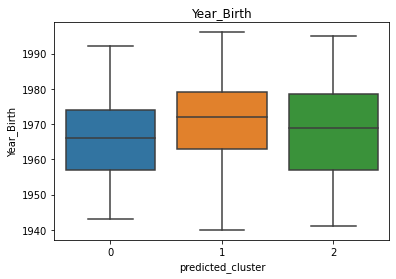

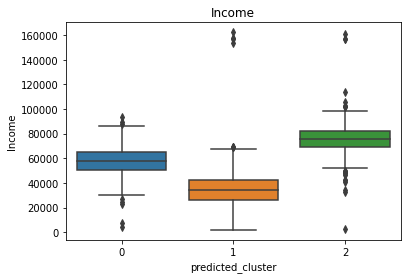

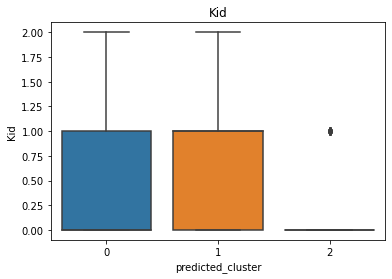

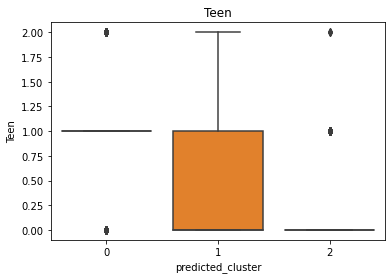

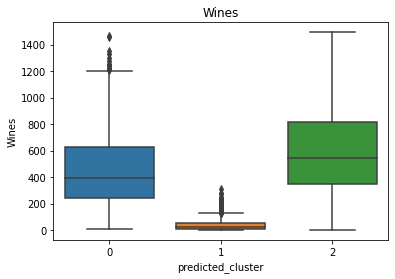

...

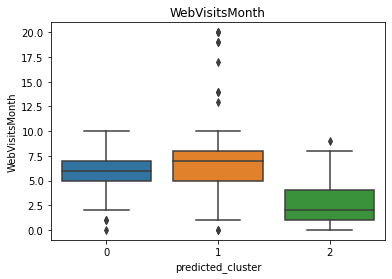

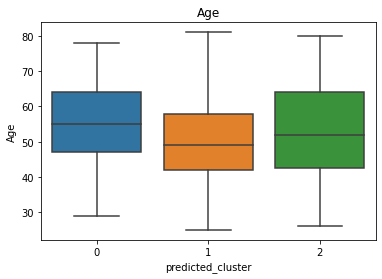

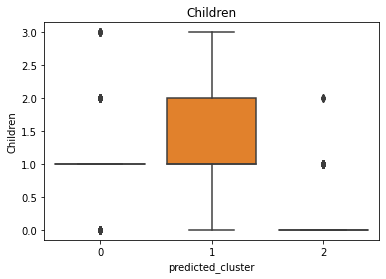

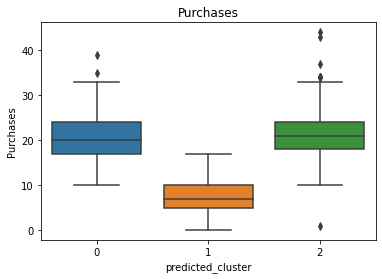

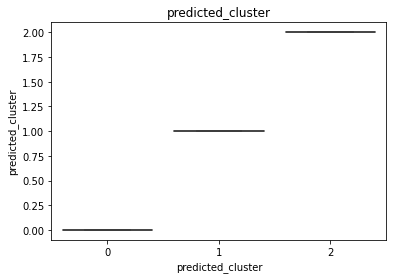

In [77]:
df_combo_predicted_num = df_combo_predicted[['Year_Birth', 'Income', 'Kid', 'Teen', 'Wines', 'Fruits', 'Meat', 'Fish', 'Sweet',
                               'Gold', 'DiscountPurchases','WebPurchases', 'CatalogPurchases', 'StorePurchases',
                               'WebVisitsMonth', 'Age', 'Children', 'Purchases', 'predicted_cluster']]
df_combo_predicted_cat = df_combo_predicted[['Education', 'Marital_Status','Kid','Teen','Children', 'predicted_cluster']]

for col in df_combo_predicted_num.columns:
    sns.boxplot(x='predicted_cluster', y=col, data=df_combo_predicted_num)
    plt.title(col)
    plt.show()

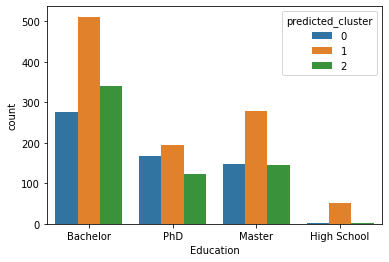

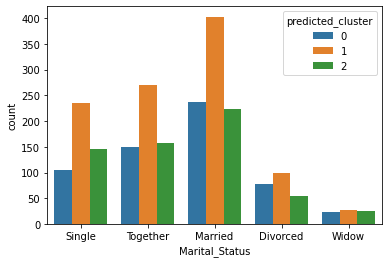

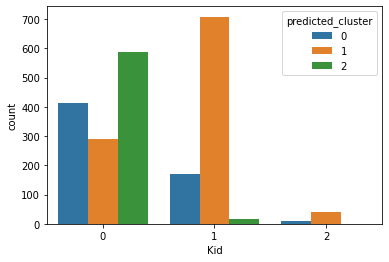

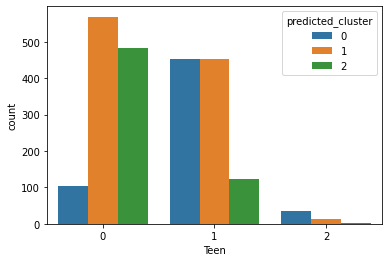

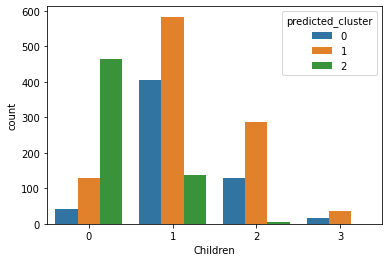

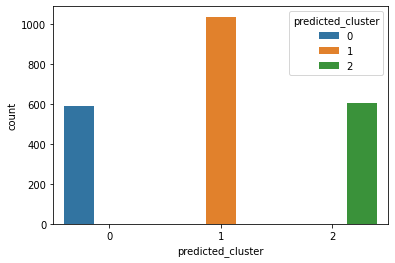

In [35]:
for i in df_combo_predicted_cat:
#     df = create_df_with(i)
    plt.figure() #this creates a new figure on which your plot will appear
    sns.countplot(x=i, hue="predicted_cluster", data=df_combo_predicted_cat)

From a brief glance, we can see that, among the three clusters, there are no significant differences in education level and marital status. However, there are some slight differences in age distributions and big differences in income and children numbers.


Cluster 0: mostly has 1 child, has the middle income and middle purchase, visits the company's web more often and purchase via the web more than the other two clusters.

Cluster 1: mostly 1-2 children Among the three groups, this group has the largest proportion of consumers with only high school education, lowest average income, the lowest amount of groceries purchase, more likely to visit the company's website and purchase through discount.

Cluster 2: age is similar to cluster 1 but slightly higher than cluster 2, has the highest income, highest groceries purchase (i.e. fish, meat, sweets, wine, etc), highest overall purchase, most likely to purchase through catalog and store, but they have lowest children numbers.

Overall, the income and purchase relationships are not surprising. I would predict there are some correlations between clusters and education levels, but there was no strong correlation. Considering that I haven't used education to train the model and education is not a pre-assigned label, the result is acceptable. The surprising finding is the negative correlation between income, purchase, and children numbers. From the clustering, we can clearly see from the dataset, customers with more purchase has fewer children, and vice versa. This is a surprising finding.

Next, I will conduct the K-prototype method, which will include the two categorical attributes to train the model.

## 8. K-prototypes

**8.1 Parameter Selection**

Since K-Means is calculated using the Euclidean distance is only suitable for numerical data, in the exploratory journey, we omitted the two categorical attributes. Even though we haven't seen any clustering pattern when plotting the two attributes back to t-SNE plots, we are still interested in confirming whether these two categorical attributes will influence the clustering. Let's perform another unsupervised learning (K-prototypes) method that allows mixed data types. K-prototype is a refined version of Kmodes (for categorical), which will work for mixed datatype (categorical and numerical). In order to perform K-prototype, Gower distance transform is needed.

In [36]:
df_kp = df[["Education","Marital_Status",'Income', 'Children', 'Wines', 'Fruits', 'Meat', 'Fish', 'Sweet', 'Gold', 'DiscountPurchases', 'WebPurchases','StorePurchases', 'CatalogPurchases',"WebVisitsMonth"]]

K-Prototype is a clustering method based on partitioning. Its algorithm is an improvement of the K-Means and K-Mode clustering algorithm to handle clustering with the mixed data types.

First of all, let's create a target data frame including the two categorical attributes. 

In [37]:
# create a gower distance matrix using the df with 2 categorical attributes + previous numerical attribues used in the K-means
dist_mat_si=gower_matrix(df_kp)
dist_mat_si

array([[0.        , 0.2682095 , 0.22071108, ..., 0.26239714, 0.3104142 ,
        0.36371183],
       [0.2682095 , 0.        , 0.2691083 , ..., 0.2647227 , 0.30855116,
        0.1711643 ],
       [0.22071108, 0.2691083 , 0.        , ..., 0.1632519 , 0.13330701,
        0.32016623],
       ...,
       [0.26239714, 0.2647227 , 0.1632519 , ..., 0.        , 0.25642323,
        0.31405222],
       [0.3104142 , 0.30855116, 0.13330701, ..., 0.25642323, 0.        ,
        0.2929424 ],
       [0.36371183, 0.1711643 , 0.32016623, ..., 0.31405222, 0.2929424 ,
        0.        ]], dtype=float32)

Like what we did in K-means, let's run the t-SNE plots again using different perplexity values and random state.

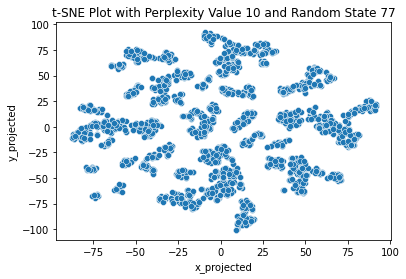

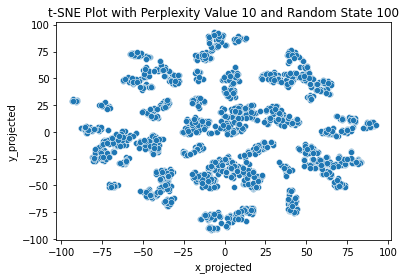

--------------------------------------------


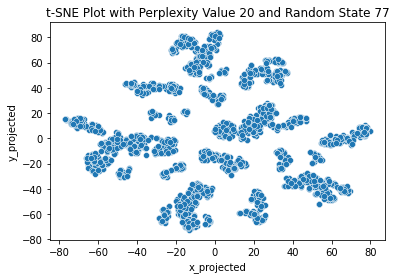

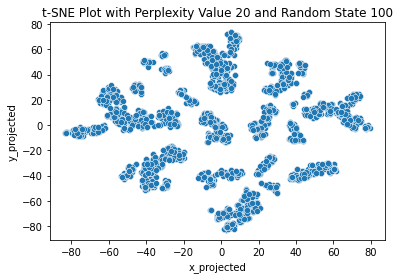

--------------------------------------------


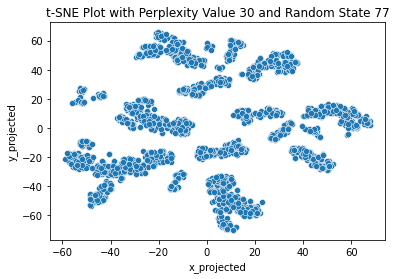

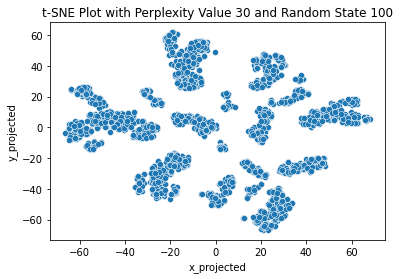

--------------------------------------------


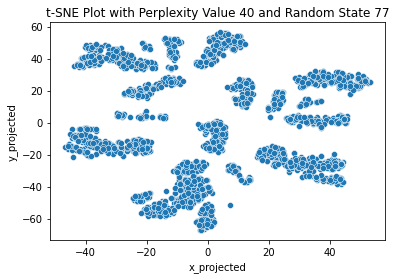

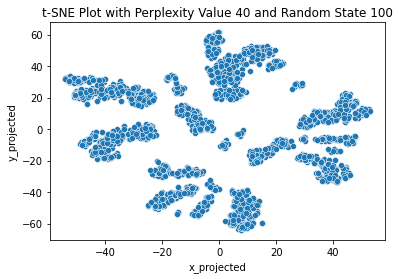

--------------------------------------------


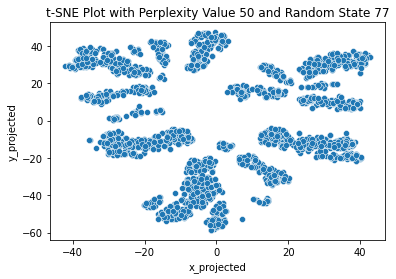

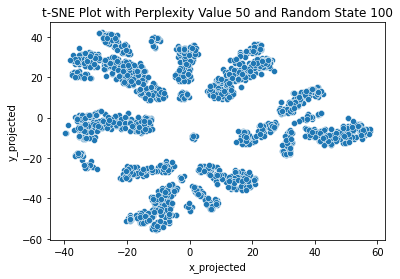

--------------------------------------------


In [38]:
for perp in [10, 20, 30, 40, 50]:
    for rs in [77, 100]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs, metric='precomputed')
        data_tsne = tsne.fit_transform(dist_mat_si)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo_kp = pd.concat([df, df_tsne], axis=1)
        df_combo_HAC = df_combo_kp.copy() # Copy the dataframe for later HAC use
        sns.scatterplot(x='x_projected',y='y_projected', data=df_combo_kp)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.show()
    print('--------------------------------------------')

We can see from the above t-SNE plots, for lower perplexity values, the data points are scattered around and there are no certain clustering structure. As the perp values increase, we gradually see clusters forming.

The t-SNE plot of perp 40 ans random state 77 suggests 10+ clusters. It is possible that the t-SNE plot is influenced by the categorical data.<br/>

As discussed previously, since the numerical attributes are of different scales, similar to was done in K-means, we will standardize the numerical attributes 

In [39]:
# separate categorical and numerical dateset
df_kp_cat = df_kp[["Education","Marital_Status"]]
df_kp_num = df_kp.drop(["Education","Marital_Status"], axis =1)

In [40]:
# scale the numerical data, then concat the two data back to one
scaled_kp=StandardScaler().fit_transform(df_kp_num)
df_kp_num=pd.DataFrame(scaled_kp, columns=df_kp_num.columns)
df_scaled_kp = pd.concat([df_kp_cat, df_kp_num], axis = 1)
df_scaled_kp.head()

,Education,Marital_Status,Income,Children,Wines,Fruits,Meat,Fish,Sweet,Gold,DiscountPurchases,WebPurchases,StorePurchases,CatalogPurchases,WebVisitsMonth
0,Bachelor,Single,0.288658,-1.264308,0.983228,1.554170,1.679746,2.461068,1.475396,0.845669,0.348738,1.407639,-0.552429,2.509801,0.692865
1,Bachelor,Single,-0.262293,1.395139,-0.871064,-0.636431,-0.713455,-0.650414,-0.631638,-0.729742,-0.168700,-1.110921,-1.167738,-0.568970,-0.131421
2,Bachelor,Together,0.918137,-1.264308,0.362159,0.572177,-0.177201,1.344595,-0.147262,-0.038098,-0.686137,1.407639,1.293496,-0.226884,-0.543564
3,Bachelor,Together,-1.182477,0.065416,-0.871064,-0.560893,-0.651409,-0.503991,-0.583200,-0.748954,-0.168700,-0.751127,-0.552429,-0.911056,0.280722
4,PhD,Married,0.295899,0.065416,-0.389661,0.421101,-0.217088,0.154911,-0.001950,-0.556831,1.383614,0.328256,0.062879,0.115201,-0.131421


Again, we are faced with the question of choosing the number of clusters. The t-SNE plot did not provide useful information. Thus, we used the elbow plot to make a decision.

In [93]:
# Calculate the inertias with different cluster numbers
cost = []
for num_clusters in list(range(1,9)):
    kp = KPrototypes(n_clusters=num_clusters, random_state=100)
    kp.fit_predict(df_scaled_kp, categorical=[0,1])
    cost.append(kp.cost_)

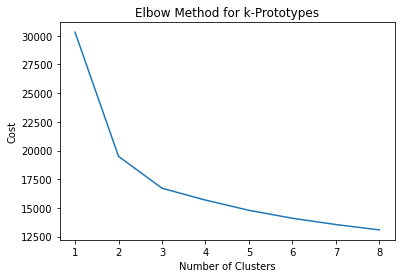

In [94]:
# Plot the elbow plot with inertias
plt.plot(list(range(1,9)),cost)
plt.xlabel('Number of Clusters')
plt.ylabel('Cost')
plt.title('Elbow Method for k-Prototypes')
plt.show()

The elbow plot shows elbows around 2 or 3 clusters, and not a large number seen in the t-SNE plot. Therefore, we chose k=3 as the model parameter. In terms of the parameters, we used the random state=100 to train the model.

**8.2 Clustering Algorithm**

In [41]:
# Train the k-prototypes model with k=3 clusters and random state 100(this could any value, just create randomness)
kp = KPrototypes(n_clusters=3, random_state=100)
fit_clusters = kp.fit_predict(df_scaled_kp, categorical=[0,1])

In [42]:
# Show the centroids of each clusters
kp.cluster_centroids_

array([['0.2620267947143092', '0.3304619227076408',
        '0.48487910798203543', '-0.1381611675432164',
        '-0.15008568346945717', '-0.17961035280683588',
        '-0.14628048517780495', '0.31554491573941906',
        '0.8189774464095236', '0.828442999506024', '0.5763292005257925',
        '0.11289009398895494', '0.2591398668245459', 'Bachelor',
        'Married'],
       ['-0.7905729895099622', '0.3641867260807608',
        '-0.7790870525232578', '-0.5435808082334069',
        '-0.642289156110599', '-0.558193543062576',
        '-0.5363743167441432', '-0.5603695003173803',
        '-0.17319033516618337', '-0.7251051621077904',
        '-0.7939244313803939', '-0.7230238921596807',
        '0.45201733374907793', 'Bachelor', 'Married'],
       ['1.0950647901992745', '-0.9444729706567996', '0.858096938288719',
        '1.0634014980619895', '1.2436648756187956', '1.1287908286944581',
        '1.0590085892733767', '0.6495890967238681',
        '-0.5028604130265372', '0.43080032520299

**8.3 Clustering Algorithm Results Presentation**

Now, we will plot the predicted clusters back to our t-SNE plot with gower matrix. 

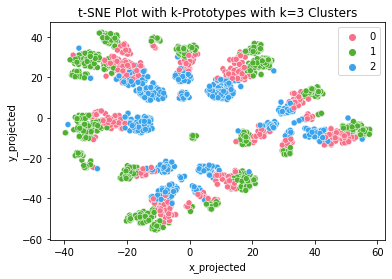

In [43]:
# Plot the predicted clusters back to our t-SNE plot with gower matrix. 
k = 3
df_combo_kp['predicted_cluster_kp']=fit_clusters
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster_kp', palette=sns.color_palette("husl", k), data=df_combo_kp)
plt.title('t-SNE Plot with k-Prototypes with k=%s Clusters' %(k))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

Interestingly, the clusters do not follow the t-SNE visual clustering pattern at all, instead, each small cluster in t-SNE contains the three clusters from the k-prototype model more or less, which might suggest that the t-SNE plot is dominated by attributes that are not important in the K-prototype modeling.

Let's have a look at the distributions of each attribute.

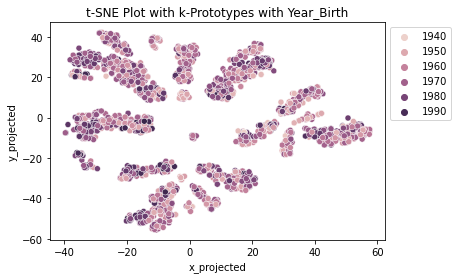

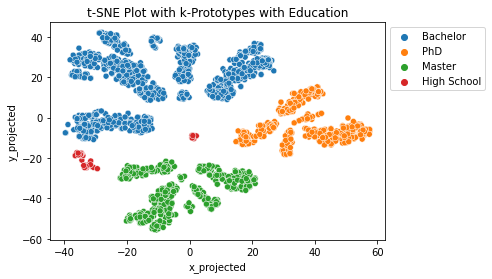

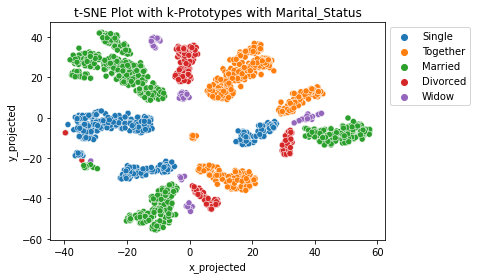

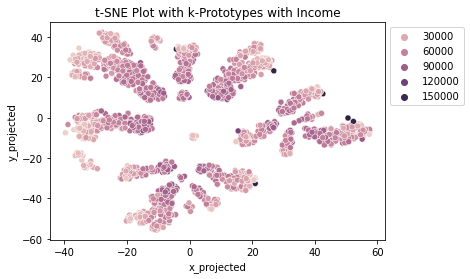

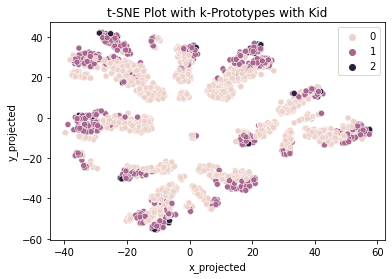

...

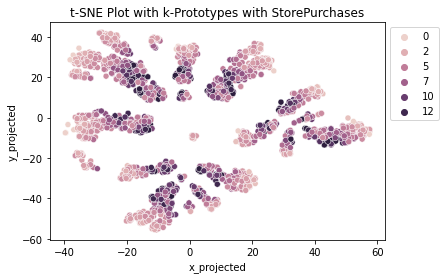

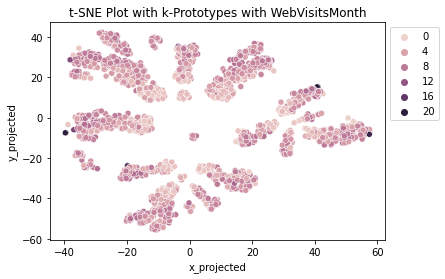

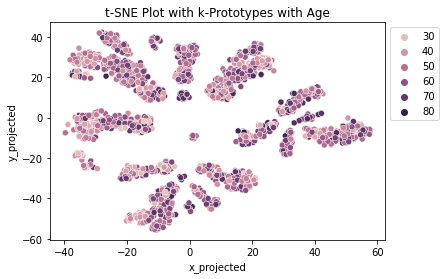

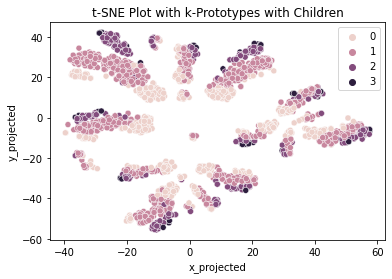

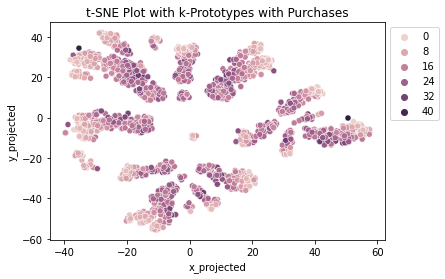

In [44]:
# loop through the attributes and plot
for i in df.columns:
  sns.scatterplot(x='x_projected',y='y_projected', hue=i,data=df_combo_kp)
  plt.title('t-SNE Plot with k-Prototypes with %s' %(i))
  plt.legend(bbox_to_anchor=(1,1))
  plt.show()

The colored-attribute t-SNE plots show that the small clusters are largely influenced by the two categorical attributes. However, when we look closely into the distributions of numerical attributes, we see similar patterns as previous K-means.

**8.4 Assessing Clustering Result Separation and Cohesion** <br/>
Now, we will assess the clustering result by creating a silhoutte plot and computing the average silhoutte score.

In [45]:
# generate different versions of dataset created to be used later

# scaled numerical data with labels for silhouette score and cluster sorted similarity matrix
df_scaled_kp_num = pd.concat([df_kp_num, df_combo_kp['predicted_cluster_kp']], axis = 1)
# unscaled categorical data with labels for plotting barplot
df_combo_kp_cat = df_combo_kp[['Education', 'Marital_Status', 'Kid', 'Teen', 'Children','predicted_cluster_kp']]
# unscaled numerical data with labels for plotting boxplot
df_combo_kp_num = df_combo_kp[['Year_Birth', 'Income', 'Kid', 'Teen', 'Wines', 'Fruits', 'Meat', 'Fish', 'Sweet',
                               'Gold', 'DiscountPurchases','WebPurchases', 'CatalogPurchases', 'StorePurchases',
                               'WebVisitsMonth', 'Age', 'Children', 'Purchases','predicted_cluster_kp']]

For n_clusters = 3 The average silhouette_score is : 0.3249073379390073


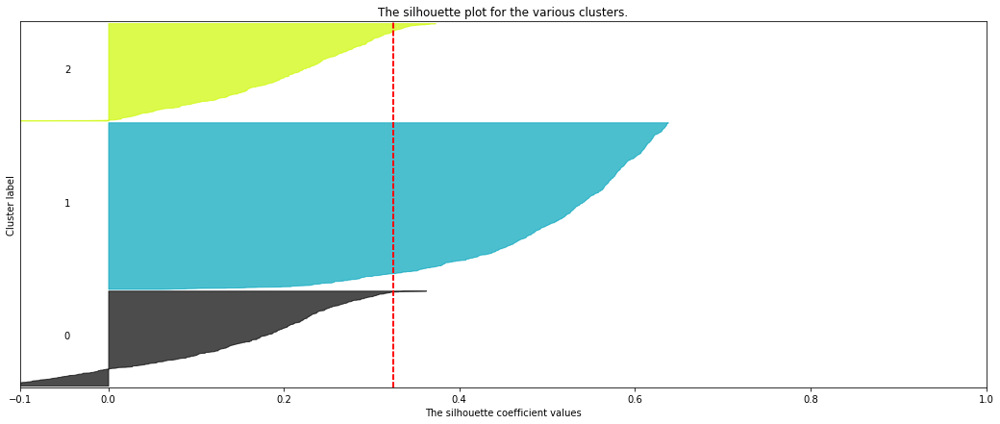

In [46]:
# Plot silhouette scores of the k=3 K-means clustering
show_silhouette_plots(df_scaled_kp_num, df_scaled_kp_num['predicted_cluster_kp'])

The silhoutte plot and average silhoutte score is identical to the one from K-means. An average silhoutte score of 0.324 shows that the clustering structure has a moderate cohesion and separation. 

**7.5 Cluster-sorted similarity matrix**<br/>
Again, we will use the cluster-sorted similarity matrix to assess the separation and cohesion. First, we will sort the dataset by the predicted cluster labels and drop them from the dataset. Then, we create a distance matrix between all objects and visualize it.

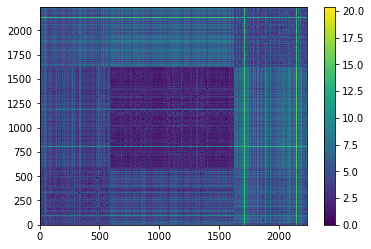

In [47]:
df_sort_kp = df_scaled_kp_num.sort_values(by=['predicted_cluster_kp'])
df_sort_kp = df_sort_kp.drop(['predicted_cluster_kp'], axis=1)

#Create a distance matrix
dist_mat = squareform(pdist(df_sort_kp))

#Then visualize the distance matrix with a heat map.
plt.pcolormesh(dist_mat)
plt.colorbar()
N = len(df_sort_kp)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

The similarity matrix is identical to the one from the K-means method.

* <u>Clusters</u>: 
 - The objects in cluster 0 are shown by the sorted indices in positions [0,591] in the plot above. 
 - The objects in cluster 1 are shown by the sorted indices in positions [592,1629] in the plot above. 
 - The objects in cluster 2 are shown by the sorted indices in positions [1630,2236] in the plot above.   
 
* <u>Cluster Separation</u>: 
 - Cluster 1 is furthest away from cluster 2 (and vice versa). (The average object distances between objects in these two clusters is larger).
 - Cluster 0 is closest to cluster 1 (and vice versa).

* <u>Cluster Cohesion</u>: 
 - All three clusters have different cohesion. (The average distance of the intra-cluster distances shown on three blocks on the block diagonal are different.) Cluster 1 seems to have better cohesion than cluster 0 and 2.
 
We can use the cluster sorted similarity matrix to quantitatively evaluate the cohesion and separation of the clustering. First, we need to scale the actual cluster sorted similarity matrix.

In [48]:
#Count the number of objects in each cluster, and sort by cluster label.
cluster_sizes=df_scaled_kp_num['predicted_cluster_kp'].value_counts().sort_index()
print('Cluster Sizes')
print(cluster_sizes)
print()

#Create a list of square matrices with all ones, each matrix is the size of a cluster.
block_list=[]
for i in cluster_sizes:
    print('Cluster Size:',i)
    block=np.ones((i,i)).tolist()
    block_list.append(block)

#Put these square matrices on the block diagonal of an otherwise 0-matrix
print()
ideal_sim_mat=block_diag(block_list[0], block_list[1], block_list[2])
ideal_sim_mat

Cluster Sizes
0     592
1    1037
2     607
Name: predicted_cluster_kp, dtype: int64

Cluster Size: 592
Cluster Size: 1037
Cluster Size: 607



array([[1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.]])

Similar to what we did in K-means, we can use the cluster sorted similarity matrix to quantitatively evaluate the cohesion and separation of the clustering. First, we need to scale the actual cluster sorted similarity matrix.

[[1.         0.83462881 0.87906806 ... 0.87207095 0.73089836 0.7677788 ]
 [0.83462881 1.         0.83066495 ... 0.78894195 0.78731984 0.79030616]
 [0.87906806 0.83066495 1.         ... 0.8288844  0.69183037 0.73939119]
 ...
 [0.87207095 0.78894195 0.8288844  ... 1.         0.67163183 0.7392844 ]
 [0.73089836 0.78731984 0.69183037 ... 0.67163183 1.         0.79748444]
 [0.7677788  0.79030616 0.73939119 ... 0.7392844  0.79748444 1.        ]]


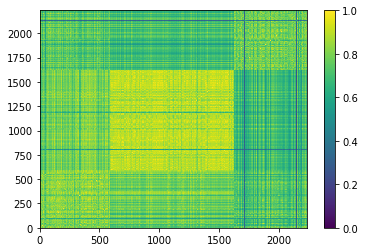

In [49]:
#Find the maximum distance in the distance matrix
min_dist=np.min(dist_mat)
#"Find" the minimum distance in the distance matrix (this will be 0) from the diagonals... ie. the distance between an object and itself is 0.
max_dist=np.max(dist_mat)

#Similarity matrix
sim_mat=1-(dist_mat-min_dist)/(max_dist-min_dist)
print(sim_mat)

#Then visualize the distance matrix with a heat map.
plt.pcolormesh(sim_mat)
plt.colorbar()
N = len(df_sort_kp)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

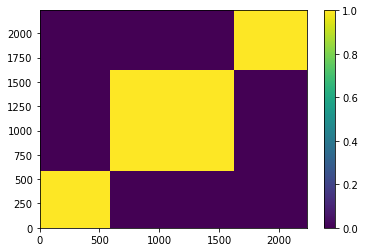

In [50]:
#Then visualize the distance matrix with a heat map.
plt.pcolormesh(ideal_sim_mat)
plt.colorbar()
N = len(df_sort_kp)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

Here, we are "flattening" both of these matrices by putting all of the rows of a given matrix into a single vector.

In [51]:
flat_sim_mat=sim_mat.flatten()
print('Flattened Actual Scaled Similarity Matrix')
print(flat_sim_mat)
    
flat_ideal_sim_mat=ideal_sim_mat.flatten()
print('Flattened Ideal Scaled Similarity Matrix')
print(flat_ideal_sim_mat)

np.corrcoef(flat_sim_mat,flat_ideal_sim_mat)

Flattened Actual Scaled Similarity Matrix
[1.         0.83462881 0.87906806 ... 0.7392844  0.79748444 1.        ]
Flattened Ideal Scaled Similarity Matrix
[1. 1. 1. ... 1. 1. 1.]


array([[1.        , 0.57906613],
       [0.57906613, 1.        ]])

Here, we achieved a correlation of 0.58. This is exactly the same value we saw in K-means. Perhaps, there is not much difference betweeen the clustering from K-means and K-prototypes. We will further investigate this later using Rand score.

**8.6 Describing Each of the Clusters**

Again, let's plot each attribute of clustering to further examine the result. We will use boxplot for numerical attributes and bar graph for categorical attributes

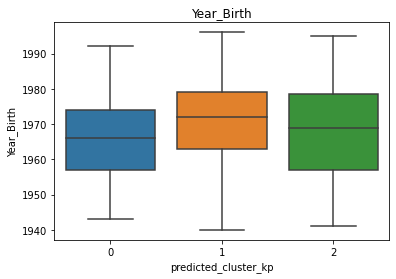

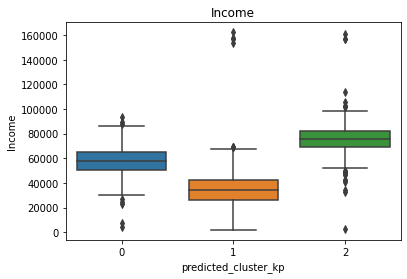

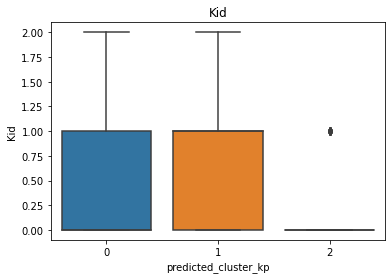

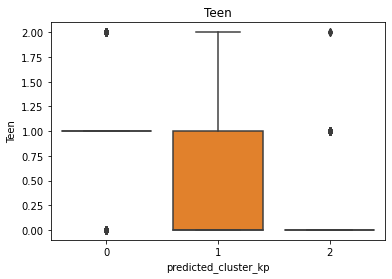

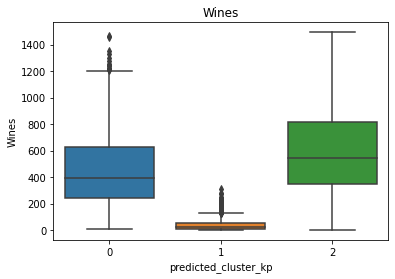

...

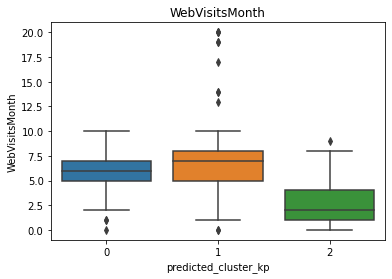

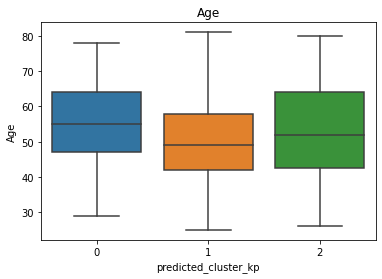

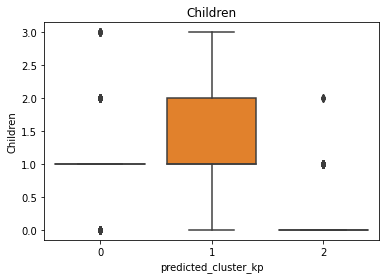

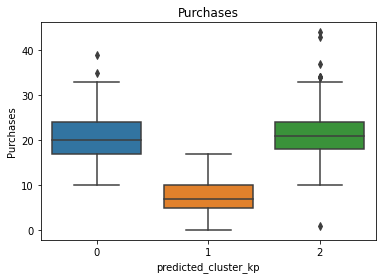

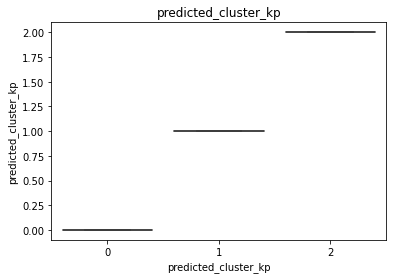

In [52]:
for col in df_combo_kp_num.columns:
    sns.boxplot(x='predicted_cluster_kp', y=col, data=df_combo_kp_num)
    plt.title(col)
    plt.show()

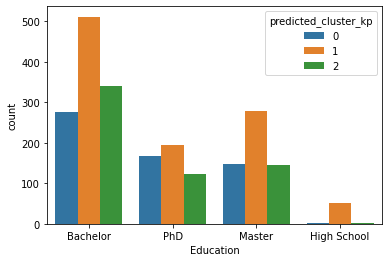

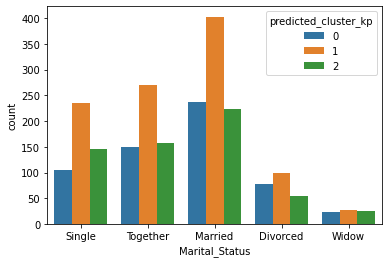

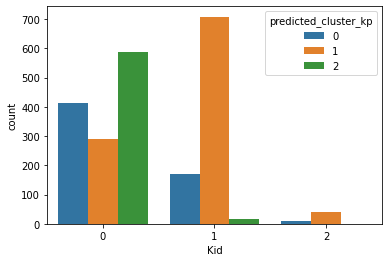

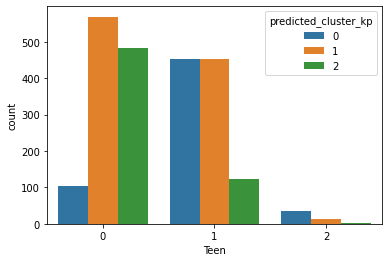

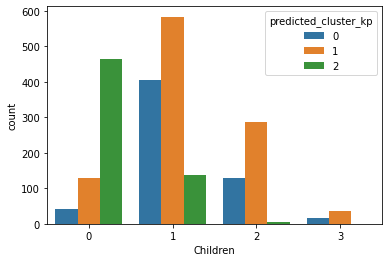

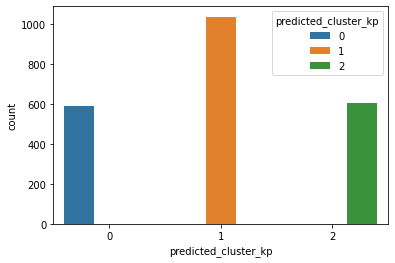

In [53]:
for i in df_combo_kp_cat:
#     df = create_df_with(i)
    plt.figure() #this creates a new figure on which your plot will appear
    sns.countplot(x=i, hue="predicted_cluster_kp", data=df_combo_kp_cat)

Surprisingly, the distribution patterns are exactly the same as the k-means clustering. Let's use the adjusted random score to further confirm this.<br/>
The Adjusted Rand score is introduced to determine whether the two cluster results are similar to each other. 

In [54]:
adjusted_rand_score(df_scaled['predicted_cluster'],df_combo_kp['predicted_cluster_kp'])

1.0

Well, more surprisingly, the adjusted rand score is 1, which indicated that the clusterings provided by the two methods are totally the same! Also, this suggests that the two categorical attributes are evenly distributed among the three clusters and caused no influence on the clustering. Since the clustering is exactly the same as K-means, we will omit the description of the attribute values of each of the clusters.

In order to further check the dataset, finally, we used Hierarchical Agglomerative Clustering (HAC) to cluster the mixed data.

## 9. Hierarchical Agglomerative Clustering (HAC)

For the previous two algorithms, even though the K-prototypes method has included the two categorical attributes, amazingly, the clustering output is totally the same as the output of K-means. In order to further investigate the mixed-type data, we will also conduct another method-hierarchical agglomerative clustering (HAC) which allows for mixed-type data. In HAC, each observation is assigned to its own cluster. Then, the similarity (or distance) between each of the clusters is computed and the two most similar clusters are merged into one. 

In [55]:
df_combo_HAC.head()

,Year_Birth,Education,Marital_Status,Income,Kid,Teen,Wines,Fruits,Meat,Fish,Sweet,Gold,DiscountPurchases,WebPurchases,CatalogPurchases,StorePurchases,WebVisitsMonth,Age,Children,Purchases,x_projected,y_projected
0,1957,Bachelor,Single,58138.0,0,0,635,88,546,172,88,88,3,8,10,4,7,64,0,25,-17.159500,-1.040982
1,1954,Bachelor,Single,46344.0,1,1,11,1,6,2,1,6,2,1,1,2,5,67,2,6,-35.509773,-0.959292
2,1965,Bachelor,Together,71613.0,0,0,426,49,127,111,21,42,1,8,2,10,4,56,0,21,11.272900,14.248659
3,1984,Bachelor,Together,26646.0,1,0,11,4,20,10,3,5,2,2,0,4,6,37,1,8,22.192009,26.881737
4,1981,PhD,Married,58293.0,1,0,173,43,118,46,27,15,5,5,3,6,5,40,1,19,46.952126,-6.623773


First, again, let's plot the t-SNE plot.

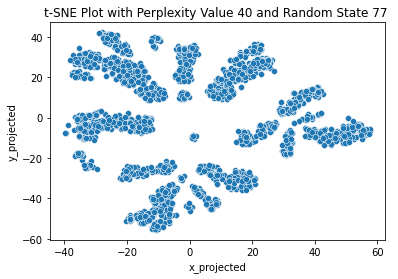

In [56]:
# plot the t-SNE plot using previous gower matrix from part 2
sns.scatterplot(x='x_projected',y='y_projected', data=df_combo_HAC)
plt.title('t-SNE Plot with Perplexity Value 40 and Random State 77 ')
plt.show()

From the previous two methods, we know that the potential clusters are not well separated and the shapes of the clusters are not spherical. So we would use the dendrograms to decide the HAC linkage method.

In [57]:
# using the previous gower matrix to create a distance matrix of all pairs of objects
dm=squareform(dist_mat_si, force = 'tovector')
dm

array([0.2682095 , 0.22071108, 0.30322132, ..., 0.25642323, 0.31405222,
       0.2929424 ], dtype=float32)

**9.1 Parameter selection**

Let’s create the dendrograms for the four linkage methods(single, average, complete, and ward). Single linkage will go first.

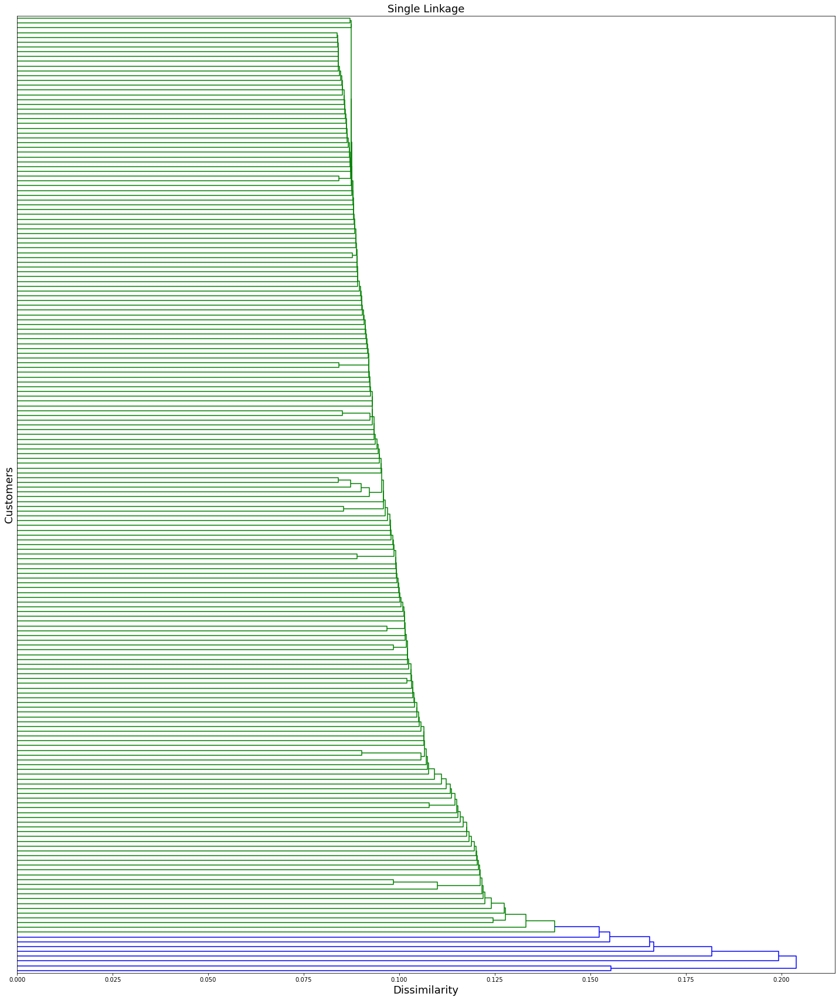

In [58]:
# create the dendrogram using the matrix for single linakge
Z_sin = linkage(dm, method='single')

# plot the dendrogram with single linkage
fig, ax = plt.subplots(figsize=(25, 30))
d = dendrogram(Z_sin, orientation='right', ax=ax, truncate_mode='lastp', p=200, no_labels=True)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Customers', fontsize=18)
plt.yticks(fontsize=12)
plt.title('Single Linkage', fontsize=18)
plt.show()

We can see from the above dendrogram that the single linkage method of this dataset was strongly influenced by the outliers. The first several clusters are grouped by the singleton clusters. Well, this is not an uncommon thing to see when HAC with single linkage is applied to a dataset with outliers.

Next, we try average linkage.

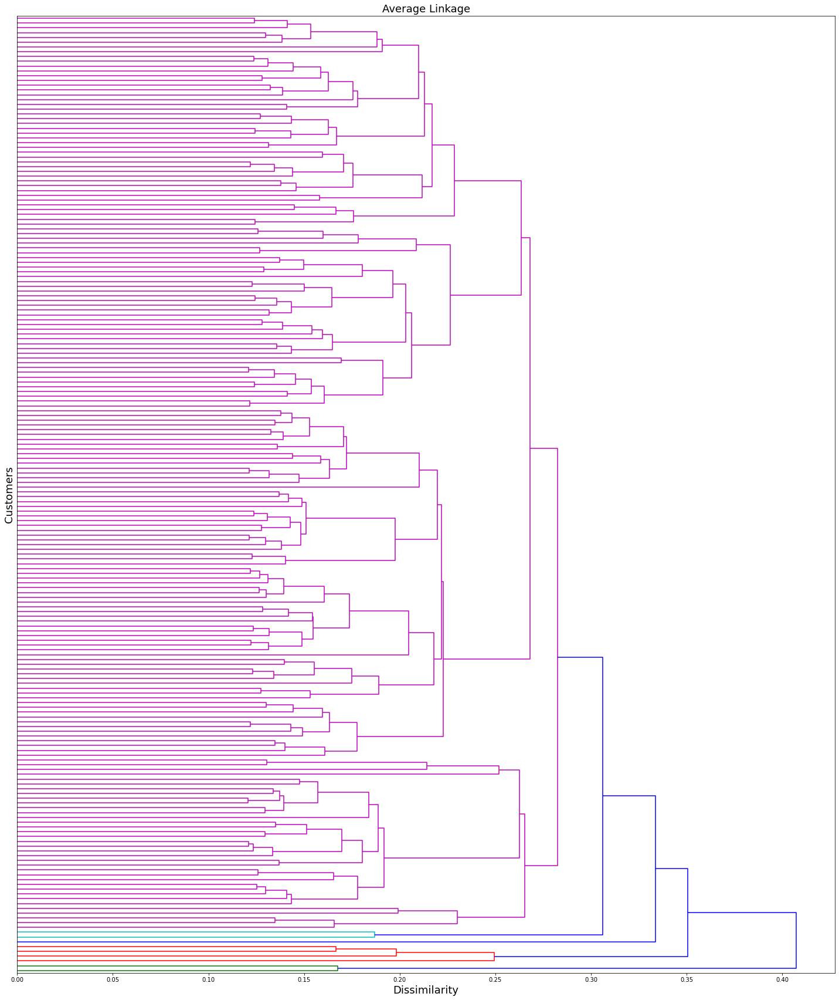

In [59]:
# create the dendrogram using the matrix for average linakge
Z_ave = linkage(dm, method='average')

# plot the dendrogram with average linkage
fig, ax = plt.subplots(figsize=(25, 30))
d = dendrogram(Z_ave, orientation='right', ax=ax, truncate_mode='lastp', p=200, no_labels=True)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Customers', fontsize=18)
plt.yticks(fontsize=12)
plt.title('Average Linkage', fontsize=18)
plt.show()

The dendrogram for HAC with average linkage is above. In the dendrogram, we can see that it is quite similar to the single linkage, most of the k=2, k=3.. clusters that are created are singleton clusters. Again, the average linkage of this dataset was strongly influenced by the outliers.

Next, let's conduct complete linakge.

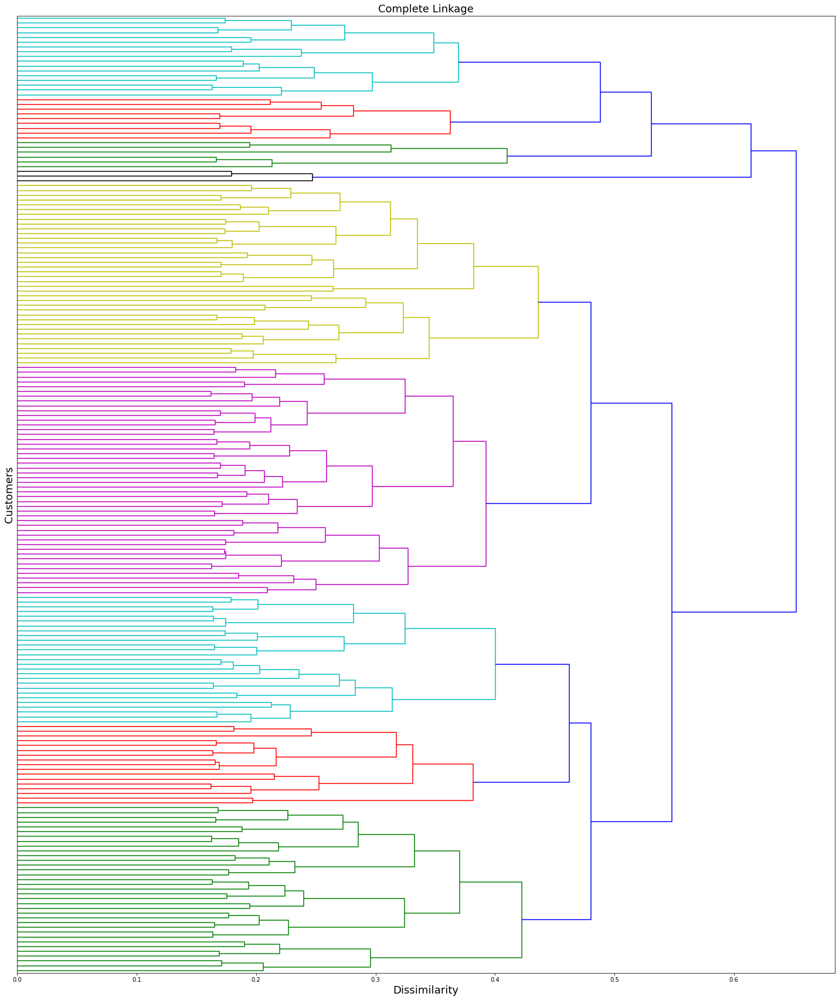

In [60]:
# create the dendrogram using the matrix for complete linakge
Z_com = linkage(dm, method='complete')

# plot the dendrogram with complete linkage
fig, ax = plt.subplots(figsize=(25, 30))
d = dendrogram(Z_com, orientation='right', ax=ax, truncate_mode='lastp', p=200, no_labels=True)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Customers', fontsize=18)
plt.yticks(fontsize=12)
plt.title('Complete Linkage', fontsize=18)
plt.show()

The dendrogram for HAC with complete linkage seems to be better, only with k=2, one cluster was grouped by some outliers, then we can see clusters which are not singletons. However, the number of data points in these potential clusters are not well balanced. 

Last but not least, we will plot ward linkage.

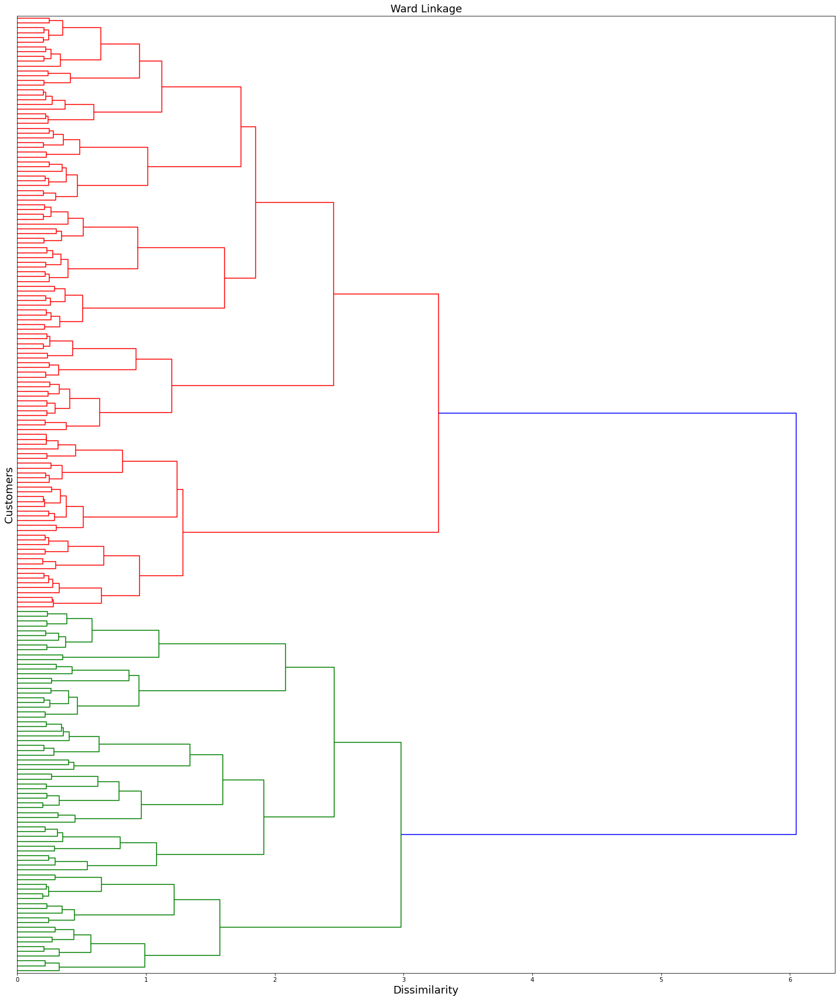

In [61]:
# create the dendrogram using the matrix for ward linakge
Z_ward = linkage(dm, method='ward')

# plot the dendrogram with ward linkage
fig, ax = plt.subplots(figsize=(25, 30))
d = dendrogram(Z_ward, orientation='right', ax=ax, truncate_mode='lastp', p=200, no_labels=True)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Customers', fontsize=18)
plt.yticks(fontsize=12)
plt.title('Ward Linkage', fontsize=18)
plt.show()

With no surprise, the dendrogram for HAC with Ward's linkage above shows a better clustering pattern. The first three clusters identified are all large clusters without singleton clusters. We will continue the HAC with Ward's linkage.

Next, we will extract clustering from the dendrogram and use t-SNE plot with different clustering numbers to make a decision of how many clusters we will use.

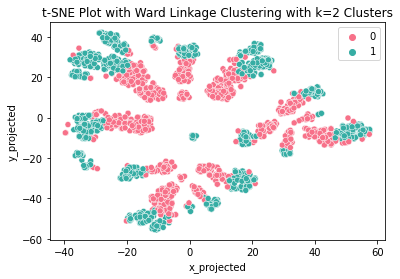

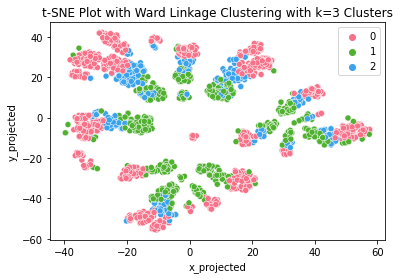

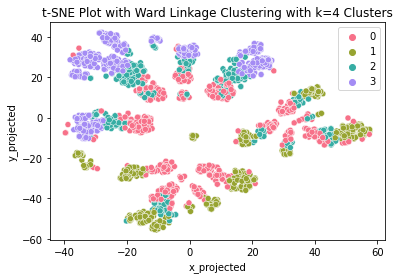

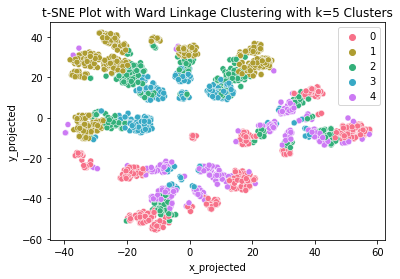

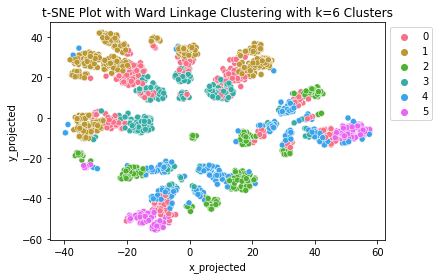

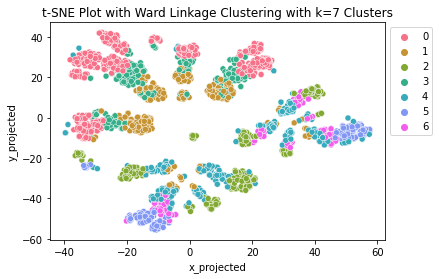

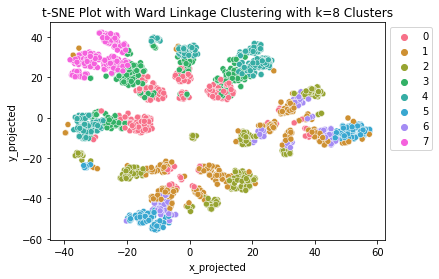

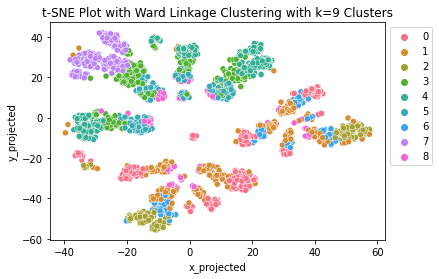

In [62]:
for k in range(2,10):

    #Clustering from dendrogram with k clusters
    hac = AgglomerativeClustering(n_clusters=k, linkage='ward')
    df_combo_HAC['predicted_cluster_HAC'] = hac.fit_predict(dist_mat_si)

    #Map the resulting cluster labels onto our chosen t-SNE plot
    sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster_HAC', palette=sns.color_palette("husl", k), data=df_combo_HAC)
    plt.title('t-SNE Plot with Ward Linkage Clustering with k=%s Clusters' %(k))
    plt.legend(bbox_to_anchor=(1,1))
    plt.show()

**9.2 Clustering algorithm**

Again, similar to k-means and k-prototypes, the t-SNE does not agree with the clustering provided by the HAC Ward’s linkage. Each small cluster on the t-SNE is combined with different clusters from the HAC Ward’s linkage method, even from k=2. However, we still see some color patterns of the potential clusterings and we will choose k=3 to train the HAC model.

In [63]:
# train a HAC with Ward's linkage with k=3 clusters
k=3
hac = AgglomerativeClustering(n_clusters=k, linkage='ward')
df_combo_HAC['predicted_cluster_HAC'] = hac.fit_predict(dist_mat_si)

**9.3 Clustering Algorithm Results Presentation**

Let’s plot k=3 clusters of HAC Ward’s linkage back to t-SNE plot.

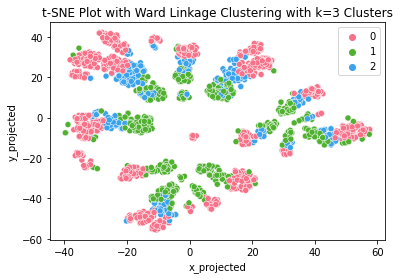

In [64]:
#Map the resulting cluster labels onto our chosen t-SNE plot
sns.scatterplot(x='x_projected',y='y_projected', hue='predicted_cluster_HAC', palette=sns.color_palette("husl", k), data=df_combo_HAC)
plt.title('t-SNE Plot with Ward Linkage Clustering with k=%s Clusters' %(k))
plt.legend(bbox_to_anchor=(1,1))
plt.show()

In fact, we can see that the clustering patterns are quite similar to the k-prototypes output. One of the clusters is closer to the center of the plot,  another cluster is distributed outwards, and the last cluster is on the outermost.

Out of curiosity, we will use the adjusted rand score to check the similarity of the predicted clusters between HAC and k-prototypes.

In [65]:
adjusted_rand_score(df_combo_kp['predicted_cluster_kp'], df_combo_HAC['predicted_cluster_HAC'])

0.6063221244597238

Well, the adjusted rand score value 0.606 confirms that the clustering pattern of HAC is similar to k-prototypes. 

Again, to check the distributions of each attribute, let's plot the attribute back to the t-SNE plot and compare with the above predicted clusters by HAC.

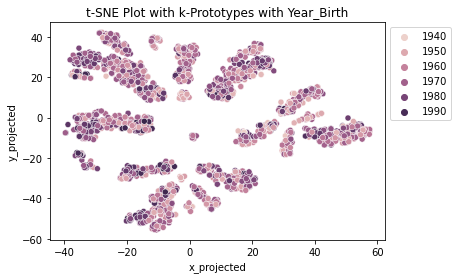

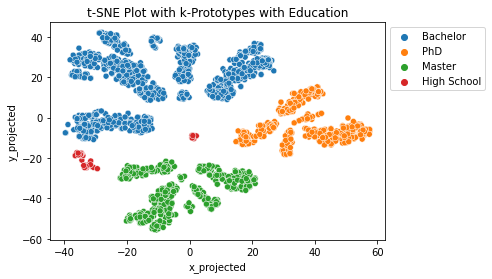

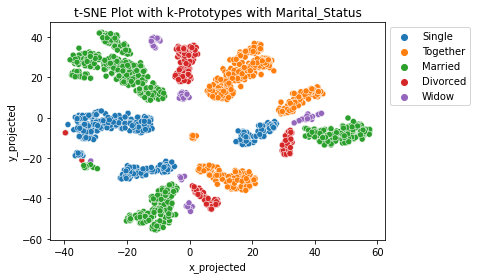

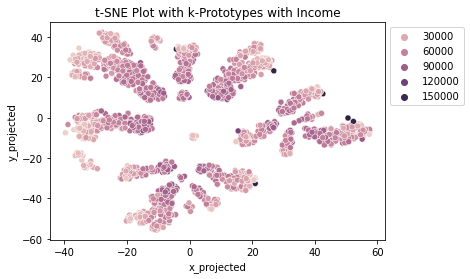

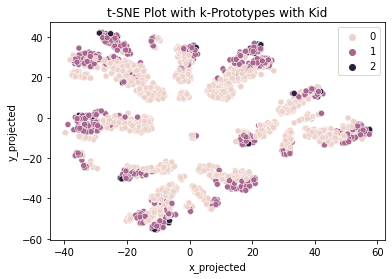

...

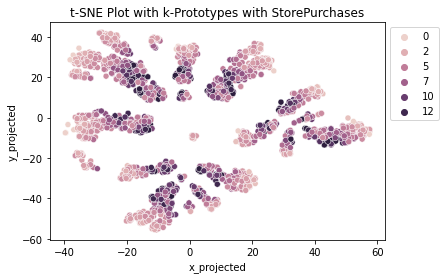

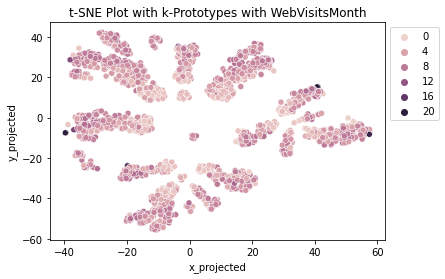

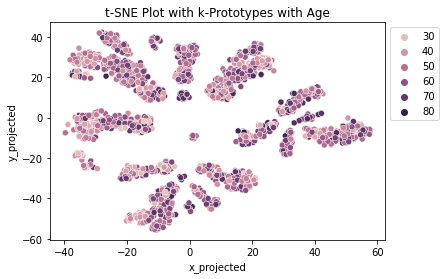

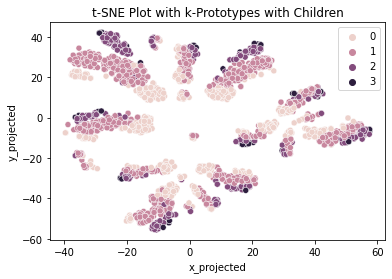

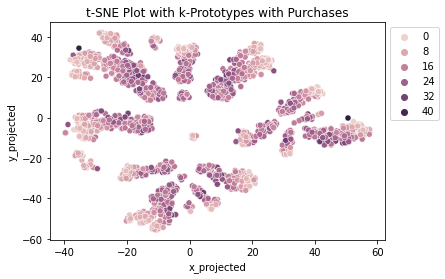

In [66]:
for i in df.columns:
  sns.scatterplot(x='x_projected',y='y_projected', hue=i,data=df_combo_HAC)
  plt.title('t-SNE Plot with k-Prototypes with %s' %(i))
  plt.legend(bbox_to_anchor=(1,1))
  plt.show()

**9.4. Assessing Clustering Result Separation and Cohesion**

Same as previous methods, let’s conduct several post-analysis. We'll do silhouette scores to check the cohesion and separation of the clustering.

In [67]:
# scaled numerical data with labels to calculate silhouette score and cluster sorted similarity matrix
df_scaled_HAC_num = pd.concat([df_scaled, df_combo_HAC['predicted_cluster_HAC']], axis = 1)

For n_clusters = 3 The average silhouette_score is : 0.30370947592843234


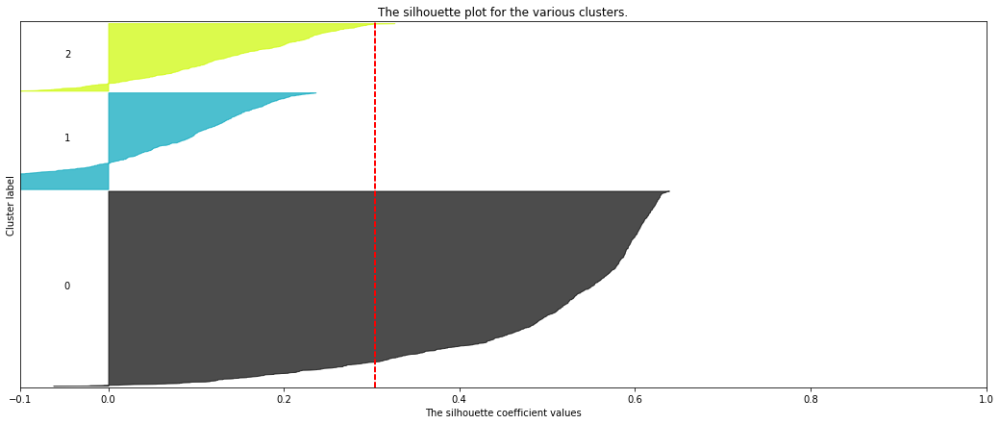

In [68]:
# Plot silhouette scores of the k=3 K-means clustering
show_silhouette_plots(df_scaled_HAC_num, df_scaled_HAC_num['predicted_cluster_HAC'])

From the above plot, we can see that these three clusters contain different numbers of values.<br/>
Cluster 0 has a much more rounded shape than the other clusters, which indicates a more uniform level of cohesion and separation among the objects assigned to that cluster. Cluster 0 contains more values than the other 2 clusters.<br/> 
We also see that there are some objects in clusters 1 and 2 that are closer to another cluster than the one that they were assigned to.<br/>
Based on the average silhoutte score of 0.304, they have a moderate cohesion and separation. 

**9.5 Cluster-sorted similarity matrix**<br/>

Here, we will use the cluster-sorted similarity matrix to assess the separation and cohesion. First, we will sort the dataset by the predicted cluster labels and drop them from the dataset.

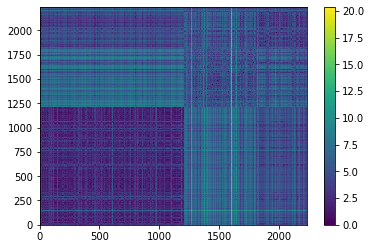

In [69]:
df_sort_HAC = df_scaled_HAC_num.sort_values(by=['predicted_cluster_HAC'])
df_sort_HAC = df_sort_HAC.drop(['predicted_cluster_HAC'], axis=1)

#Create a distance matrix
dist_mat = squareform(pdist(df_sort_HAC))

#Then visualize the distance matrix with a heat map.
plt.pcolormesh(dist_mat)
plt.colorbar()
N = len(df_sort_HAC)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

* <u>Clusters</u>: 
 - The objects in cluster 0 are shown by the sorted indices in positions [0,1212] in the plot above. 
 - The objects in cluster 1 are shown by the sorted indices in positions [1213,1814] in the plot above. 
 - The objects in cluster 2 are shown by the sorted indices in positions [1815,2236] in the plot above.   
 
* <u>Cluster Separation</u>: 
 - Cluster 0 is furthest away from cluster 1 (and vice versa). (The average object distances between objects in these two clusters is larger).
 - Cluster 1 is closest to cluster 2 (and vice versa).

* <u>Cluster Cohesion</u>: 
 - All three clusters have different cohesion. (The average distance of the intra-cluster distances shown on three blocks on the block diagonal are different.)
 
We can use the cluster sorted similarity matrix to quantitatively evaluate the cohesion and separation of the clustering. First, we need to scale the actual cluster sorted similarity matrix.

In [70]:
#Count the number of objects in each cluster, and sort by cluster label.
cluster_sizes=df_scaled_HAC_num['predicted_cluster_HAC'].value_counts().sort_index()
print('Cluster Sizes')
print(cluster_sizes)
print()

#Create a list of square matrices with all ones, each matrix is the size of a cluster.
block_list=[]
for i in cluster_sizes:
    print('Cluster Size:',i)
    block=np.ones((i,i)).tolist()
    block_list.append(block)

#Put these square matrices on the block diagonal of an otherwise 0-matrix
print()
ideal_sim_mat=block_diag(block_list[0], block_list[1], block_list[2])
ideal_sim_mat

Cluster Sizes
0    1213
1     602
2     421
Name: predicted_cluster_HAC, dtype: int64

Cluster Size: 1213
Cluster Size: 602
Cluster Size: 421



array([[1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.]])

Similar to what we did in K-means and K-prototypes, we can use the cluster sorted similarity matrix to quantitatively evaluate the cohesion and separation of the clustering. First, we need to scale the actual cluster sorted similarity matrix.

[[1.         0.92930019 0.89736613 ... 0.77861739 0.73310595 0.80215905]
 [0.92930019 1.         0.92077189 ... 0.72688705 0.70618688 0.7563196 ]
 [0.89736613 0.92077189 1.         ... 0.73818647 0.74098828 0.77178019]
 ...
 [0.77861739 0.72688705 0.73818647 ... 1.         0.74341835 0.84377799]
 [0.73310595 0.70618688 0.74098828 ... 0.74341835 1.         0.83155542]
 [0.80215905 0.7563196  0.77178019 ... 0.84377799 0.83155542 1.        ]]


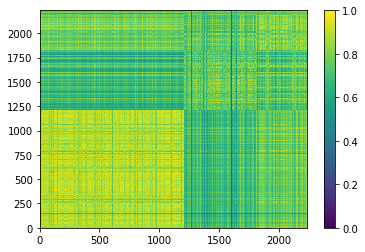

In [71]:
#Find the maximum distance in the distance matrix
min_dist=np.min(dist_mat)
#"Find" the minimum distance in the distance matrix (this will be 0) from the diagonals... ie. the distance between an object and itself is 0.
max_dist=np.max(dist_mat)

#Similarity matrix
sim_mat=1-(dist_mat-min_dist)/(max_dist-min_dist)
print(sim_mat)

#Then visualize the distance matrix with a heat map.
plt.pcolormesh(sim_mat)
plt.colorbar()
N = len(df_sort_HAC)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

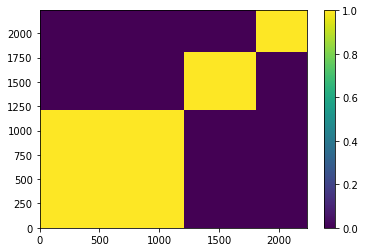

In [72]:
#Then visualize the distance matrix with a heat map.
plt.pcolormesh(ideal_sim_mat)
plt.colorbar()
N = len(df_sort_HAC)
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

Here, we are "flattening" both of these matrices by putting all of the rows of a given matrix into a single vector.

In [73]:
flat_sim_mat=sim_mat.flatten()
print('Flattened Actual Scaled Similarity Matrix')
print(flat_sim_mat)
    
flat_ideal_sim_mat=ideal_sim_mat.flatten()
print('Flattened Ideal Scaled Similarity Matrix')
print(flat_ideal_sim_mat)

np.corrcoef(flat_sim_mat,flat_ideal_sim_mat)

Flattened Actual Scaled Similarity Matrix
[1.         0.92930019 0.89736613 ... 0.84377799 0.83155542 1.        ]
Flattened Ideal Scaled Similarity Matrix
[1. 1. 1. ... 1. 1. 1.]


array([[1.        , 0.60687963],
       [0.60687963, 1.        ]])

Here, we achieved a correlation of 0.607. This is quite close to value we saw in K-means and K-prototypes. This indicates that that the clustering that HAC found is somewhat moderately close to the "ideal cohesive and well-separated" clustering that had the same number of clusters and same number of objects within each cluster.

**9.6 Describing Each of the Clusters**

Again, let's plot each attribute of clustering to further examine the result. We will use boxplot for numerical attributes and bar graph for categorical attributes

In [74]:
# unscaled categorical data with labels for plotting barplot
df_combo_HAC_cat = df_combo_HAC[['Education', 'Marital_Status', 'Kid', 'Teen', 'Children','predicted_cluster_HAC']]
# unscaled numerical data with labels for plotting boxplot
df_combo_HAC_num = df_combo_HAC[['Year_Birth', 'Income', 'Kid', 'Teen', 'Wines', 'Fruits', 'Meat', 'Fish', 'Sweet',
                               'Gold', 'DiscountPurchases','WebPurchases', 'CatalogPurchases', 'StorePurchases',
                               'WebVisitsMonth', 'Age', 'Children', 'Purchases','predicted_cluster_HAC']]

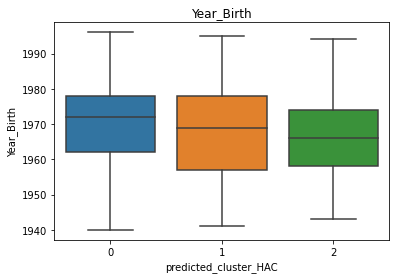

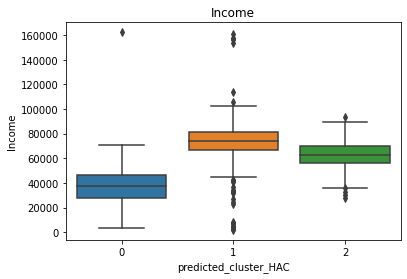

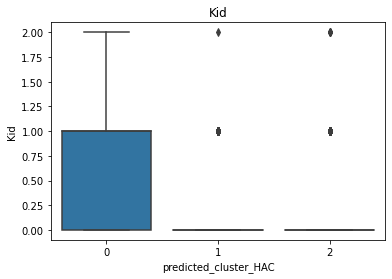

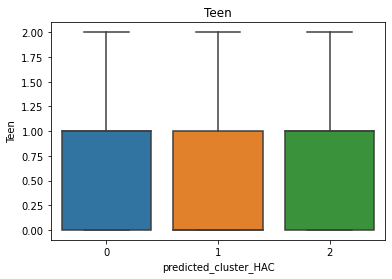

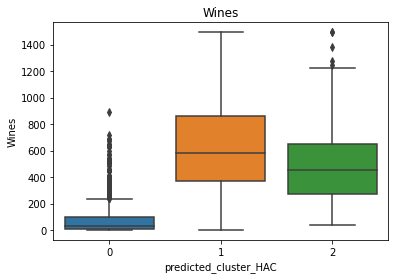

...

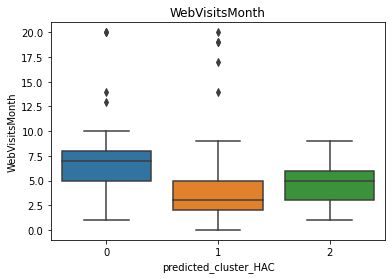

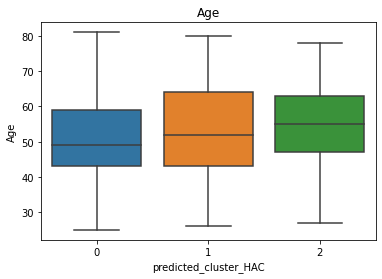

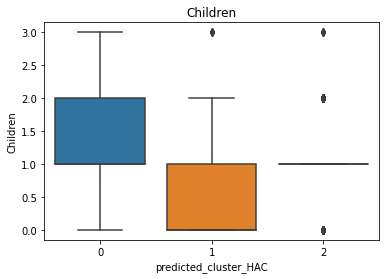

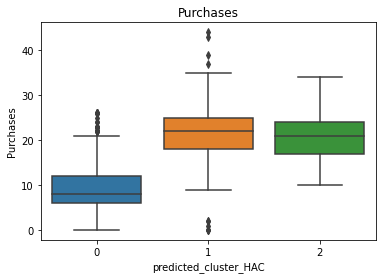

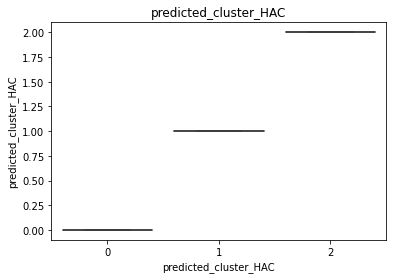

In [75]:
for col in df_combo_HAC_num.columns:
    sns.boxplot(x='predicted_cluster_HAC', y=col, data=df_combo_HAC_num)
    plt.title(col)
    plt.show()

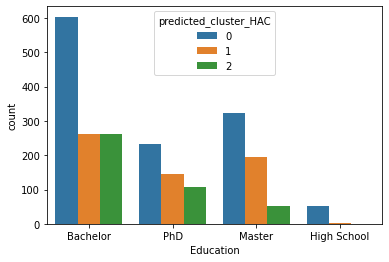

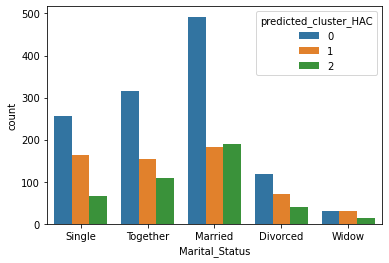

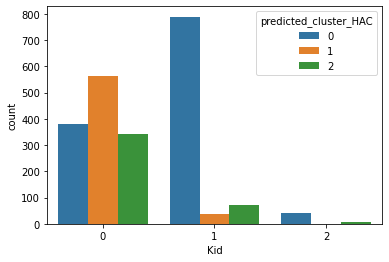

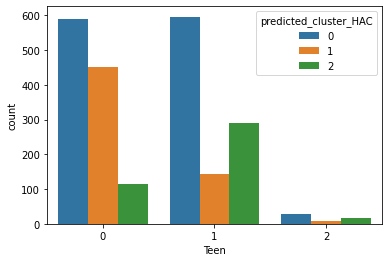

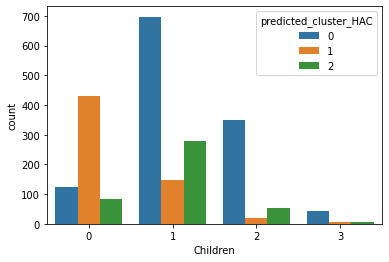

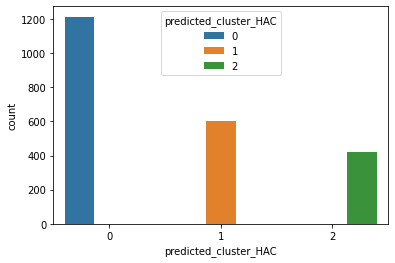

In [76]:
for i in df_combo_HAC_cat:
#     df = create_df_with(i)
    plt.figure() #this creates a new figure on which your plot will appear
    sns.countplot(x=i, hue="predicted_cluster_HAC", data=df_combo_HAC_cat)

Overall, the clustering structure of HAC appears to be very similar to the previous two. there are no significant differences in education level and marital status. However, most of the consumers with only high school education end up in cluster 0.

Cluster 0: mostly 1-2 children among the three groups, this group has the largest proportion of consumers with only high school education, lowest average income, the lowest amount of groceries purchase, more likely to visit the company's website and purchase through discount.

Cluster 1: has the highest income, highest groceries purchase (i.e. fish, meat, sweets, wine, etc), highest overall purchase, most likely to purchase through catalog and store, but they have lowest children numbers.

Cluster 2: age is similar to cluster 2 but slightly higher than cluster 0,mostly has 1 child, has the middle income and middle purchase, visits the company's web more often and purchase via the web more than the other two clusters.

# 10.Summary

In this exploratory data analysis of the customer purchase dataset, we used three unsupervised learning methods, they are  K-means, K-prototypes, and Hierarchical Agglomerative Clustering (HAC)-ward linkage. 

This dataset is mixed with both categorical and numerical types. For K-means, only a subset of numerical attributes was used, while the other two methods utilized both types.

The general procedure of conducting this clustering analysis: 
1. importing the data as Pandas data frames
2. cleaning the data frames by either replacing the NaN and reorganizing certain attributes
3. describing the data by using a pie chart, basic statistics, box plot, and correlation matrices
4. using t-SNE plot and elbow plot to decide cluster numbers
5. evaluating clustering quality by silhouette scores and cluster sorted similarity matrices
6. plotting the predicted clusters back to t-SNE plot
7. plotting the attributes back to t-SNE plot and to histograms by clusters
8. analyzing the results

For the three methods, based on the t-SNE plots, elbow plots, and dendrogram(HAC), we all used k=3 as the cluster numbers. K-means and K-prototypes generated identical clusterings, also, the clustering output of HAC-complete linkage is quite similar to the other two, which indicated that the two categorical attributes do not influence the clustering. This is contrary to our expectations that there might be some relationships between the education level and purchase as well as the marital status and the purchase. However, we haven't found any differences in these two categorical attributes among the three clusters.

Before we ran the analysis, we predicted that those with higher income would have higher purchases. The clustering algorithm confirmed our prediction. Of all three methods, the cluster with higher income consumers do the most grocery purchases and take less advantage of web discounts. However, we also found something counter-intuitive in this dataset.  Consumers with more children have relatively lower incomes. They do fewer store and catalog purchases. They buy fewer groceries in all categories. They do more discount purchases.This is an interesting finding. If we have more information, like the background of this dataset, we might find out the reasons behind this counter-intuitive result.

Since our goal is to help the company to strategize its marketing plan, with this exploratory data analysis, they can find ways to retain their highest purchasing customers as well as attract those that purchase the least. However, it can be useful to have additional information such as the overall amount spent to refine our analysis.


# 11.References

Bafghi, E. P. (2017). Clustering of customers based on shopping behavior and employing genetic algorithms. *Engineering, Technology & Applied Science Research, 7*(1), 1420–1424. https://doi.org/10.48084/etasr.752

Baumann, S., Szabo, M., & Johnston, J. (2017). Understanding the food preferences of people of low socioeconomic status. *Journal of Consumer Culture, 19*(3), 316–339. https://doi.org/10.1177/1469540517717780

Chen, M., Chiu, A., & Chang, H. (2005). Mining changes in customer behavior in retail marketing. *Expert Systems with Applications, 28*(4), 773–781. https://doi.org/10.1016/j.eswa.2004.12.033 

Kamakura, W. A., & Mazzon, J. A. (2013). Socioeconomic status and consumption in an emerging economy. *International Journal of Research in Marketing, 30*(1), 4–18. https://doi.org/10.1016/j.ijresmar.2011.12.001 

Park, C. H., Park, Y.-H., & Schweidel, D. A. (2014). A multi-category customer base analysis. *International Journal of Research in Marketing, 31*(3), 266–279. https://doi.org/10.1016/j.ijresmar.2013.12.003 

Varadarajan, R. (2020). Customer Information Resources Advantage, marketing strategy and Business Performance: A Market Resources Based View. *Industrial Marketing Management, 89*, 89–97. https://doi.org/10.1016/j.indmarman.2020.03.003